In [23]:
import torch
from torch.utils.data import Dataset
import torch.nn.functional as F
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import itertools 
import random
import numpy as np
import matplotlib.lines as mlines
import pickle
import io
from stabs import*



class CPU_Unpickler(pickle.Unpickler):
    def find_class(self, module, name):
        if module == 'torch.storage' and name == '_load_from_bytes':
            return lambda b: torch.load(io.BytesIO(b), map_location='cpu')
        else:
            return super().find_class(module, name)
def load_file(f):
    with open(f, "rb") as rb:
        pickle.load(rb)
        #return pickle.load(rb)
        return CPU_Unpickler(rb).load()
def remove_module_state(state):
    # original saved file with DataParallel
    # create new OrderedDict that does not contain `module.`
    from collections import OrderedDict
    new_state = OrderedDict()
    for k, v in state.items():
        #print(k)
        name = k[7:] # remove `module.`
        new_state[name] = v
        #print(name)
    return new_state




No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


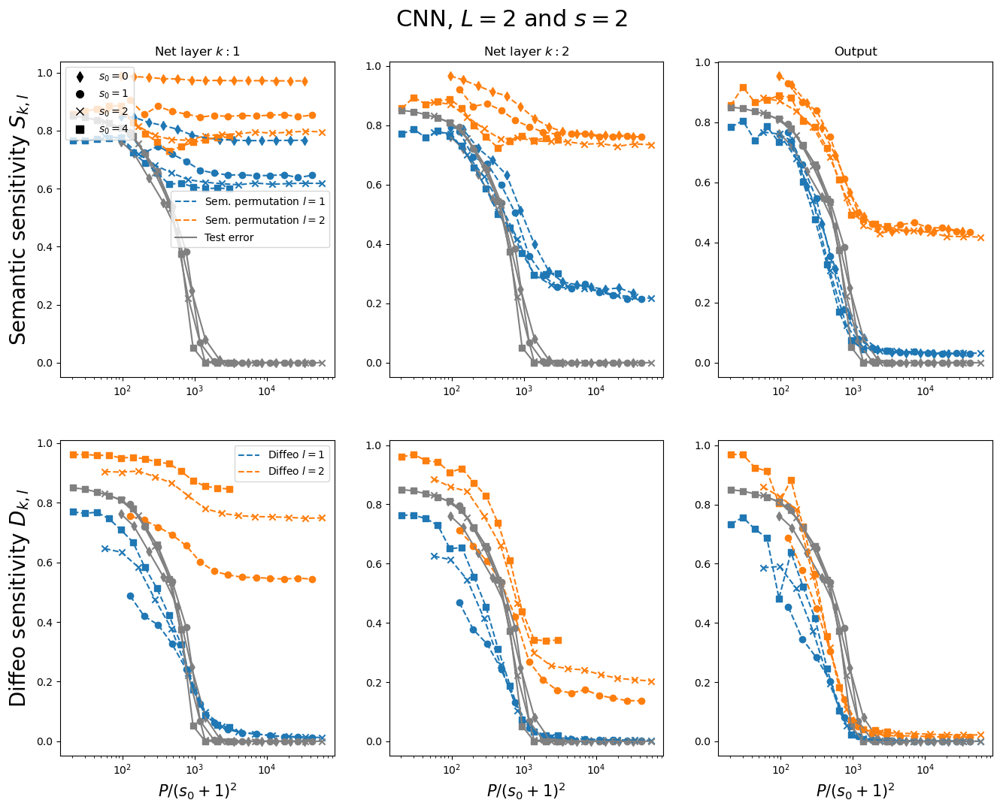

In [17]:
n=8

L=2
s=2
bs = 20
s0s = [0,1,2,4]#,2,4,6


colors = ['C'+str(gg) for gg in range(0,L)]#cm.rainbow(np.linspace(0, 1, L))

fig, axs = plt.subplots(2,(L+1), figsize = (16,12))
fig.suptitle(r"CNN, $L=2$ and $s=2$",fontsize =22,y=.94)
m = n**(s-1)
for idx_s0 in range(len(s0s)):
    s0 = s0s[idx_s0]
    
    if (L==3 and s==2) or (s==3 and n==4) or (s==4 and L==2)or (L==2 and s==3 and n==6):
        if s0>0:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
    else:
        if s0>0:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if (n==6 and s==2 and L==2):
            xx= training_point(net,s,s0,L,n,m)
        else:    
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))


    
    
    if s0>0 and L==2 and s==2:
        xx =xx
    else:
        xx = xx*n
                            
    xx = xx/(s0+1)**2 



    
    if idx_s0==0:
        mar = "d"
    elif idx_s0==1:
        mar = "o"
    elif idx_s0==2:
        mar = "x"
    elif idx_s0==3:
        mar = "s"
    for k in range(L+1):
        
        for l in range(L):
            #print(mat_all[:,k,l])
            #print(s0s[idx_s0])
            #print(xx)
            #print(mat_all_sem[idx_s0,:len(xx),k,l])
            if idx_s0==0:
                axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],label =r"Sem. permutation $l=%d$" %(l+1),ls='--') 
                #axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],label =r"Diffeo $l=%d$" %(l+1),ls='--') 
            else: 
                axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],ls='--') 
                if idx_s0==1:
                    axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],label =r"Diffeo $l=%d$" %(l+1),ls='--') 
                else:
                    axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],ls='--') 
            if s0==0:
                axs[0,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
            else:
                axs[0,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                axs[1,k].scatter(xx, mat_all_pos[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
            #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
        if k==0 and idx_s0==0:
            axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey')
        else:
            axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
        axs[0,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
        axs[1,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
        
        axs[0,k].set_xscale("log")
        axs[1,k].set_xscale("log")
        axs[1,k].set_xlabel("$P/(s_0+1)^2$",size = 15)
        #axs[k].set_ylim(0,1)
        if k==0: 
            axs[0,0].set_ylabel(r"Semantic sensitivity $S_{k,l}$",size = 20)
            axs[0,0].legend()
            axs[1,0].set_ylabel(r"Diffeo sensitivity $D_{k,l}$",size = 20)
            axs[1,0].legend()
        if k<(L):
            axs[0,k].set_title(r"Net layer $k: %d$" %(k+1))
        else:
            axs[0,L].set_title("Output")
            
s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
              markersize=7, label=r'$s_0=0$')
s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
              markersize=7, label=r'$s_0=1$')
s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
              markersize=7, label=r'$s_0=2$')
s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
              markersize=7, label=r'$s_0=4$')
first_legend = axs[0,0].legend()
ax = axs[0,0].add_artist(first_legend)
axs[0,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  


plt.savefig("figures/sens_cnn_L_%d_s_%d.png" %(L,s), bbox_inches='tight')
plt.savefig("figures/sens_cnn_L_%d_s_%d.pdf" %(L,s), bbox_inches='tight')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


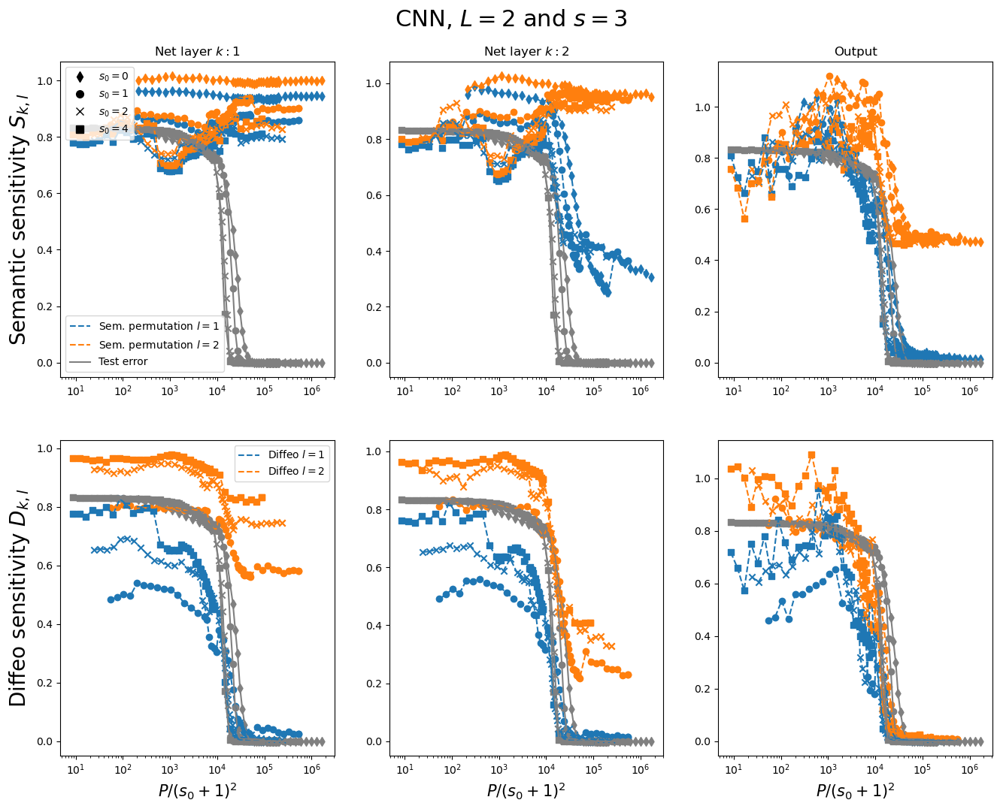

In [18]:
n=6

L=2
s=3
bs = 20
s0s = [0,1,2,4]#,2,4,6


colors = ['C'+str(gg) for gg in range(0,L)]#cm.rainbow(np.linspace(0, 1, L))

fig, axs = plt.subplots(2,(L+1), figsize = (16,12))
fig.suptitle(r"CNN, $L=2$ and $s=3$",fontsize =22,y=.94)
m = n**(s-1)
for idx_s0 in range(len(s0s)):
    s0 = s0s[idx_s0]
    
    if (L==3 and s==2) or (s==3 and n==4) or (s==4 and L==2)or (L==2 and s==3 and n==6):
        if s0>0:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
    else:
        if s0>0:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if (n==6 and s==2 and L==2):
            xx= training_point(net,s,s0,L,n,m)
        else:    
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))


    
    
    if s0>0 and L==2 and s==2:
        xx =xx
    else:
        xx = xx*n
                            
    xx = xx/(s0+1)**2 



    
    if idx_s0==0:
        mar = "d"
    elif idx_s0==1:
        mar = "o"
    elif idx_s0==2:
        mar = "x"
    elif idx_s0==3:
        mar = "s"
    for k in range(L+1):
        
        for l in range(L):
            #print(mat_all[:,k,l])
            #print(s0s[idx_s0])
            #print(xx)
            #print(mat_all_sem[idx_s0,:len(xx),k,l])
            if idx_s0==0:
                axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],label =r"Sem. permutation $l=%d$" %(l+1),ls='--') 
                #axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],label =r"Diffeo $l=%d$" %(l+1),ls='--') 
            else: 
                axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],ls='--') 
                if idx_s0==1:
                    axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],label =r"Diffeo $l=%d$" %(l+1),ls='--') 
                else:
                    axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],ls='--') 
            if s0==0:
                axs[0,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
            else:
                axs[0,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                axs[1,k].scatter(xx, mat_all_pos[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
            #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
        if k==0 and idx_s0==0:
            axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey')
        else:
            axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
        axs[0,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
        axs[1,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
        
        axs[0,k].set_xscale("log")
        axs[1,k].set_xscale("log")
        axs[1,k].set_xlabel("$P/(s_0+1)^2$",size = 15)
        #axs[k].set_ylim(0,1)
        if k==0: 
            axs[0,0].set_ylabel(r"Semantic sensitivity $S_{k,l}$",size = 20)
            axs[0,0].legend()
            axs[1,0].set_ylabel(r"Diffeo sensitivity $D_{k,l}$",size = 20)
            axs[1,0].legend()
        if k<(L):
            axs[0,k].set_title(r"Net layer $k: %d$" %(k+1))
        else:
            axs[0,L].set_title("Output")
            
s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
              markersize=7, label=r'$s_0=0$')
s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
              markersize=7, label=r'$s_0=1$')
s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
              markersize=7, label=r'$s_0=2$')
s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
              markersize=7, label=r'$s_0=4$')
first_legend = axs[0,0].legend()
ax = axs[0,0].add_artist(first_legend)
axs[0,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  


plt.savefig("figures/sens_cnn_L_%d_s_%d.png" %(L,s), bbox_inches='tight')
plt.savefig("figures/sens_cnn_L_%d_s_%d.pdf" %(L,s), bbox_inches='tight')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


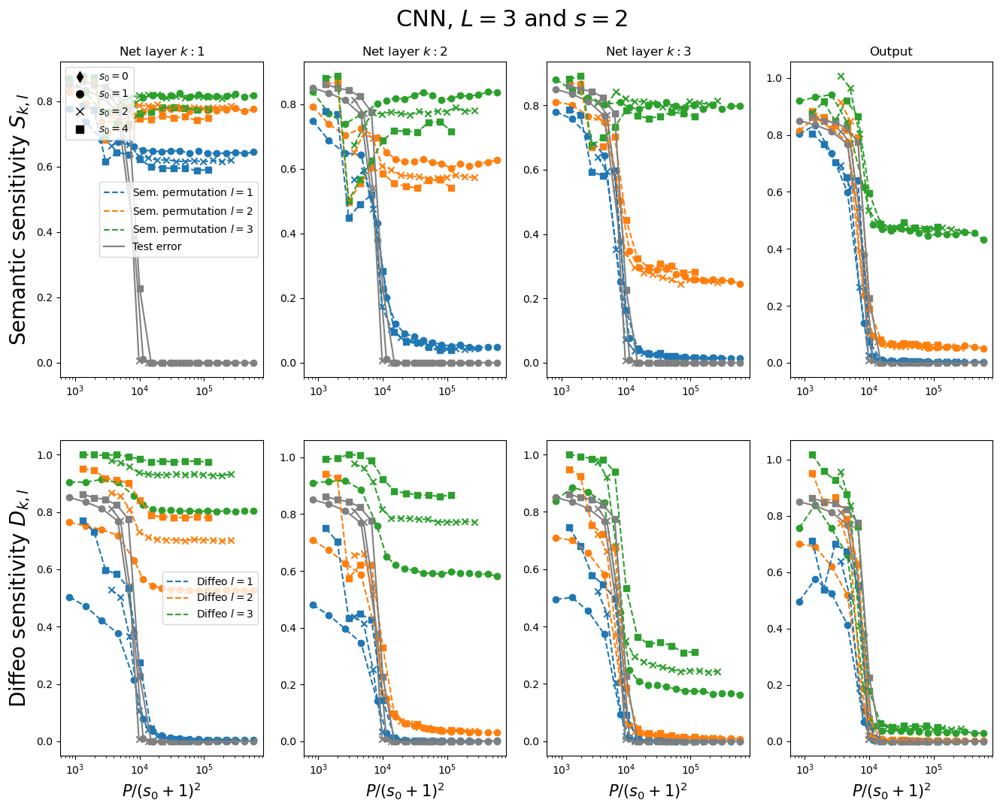

In [19]:
n=8

L=3
s=2
bs = 20
s0s = [0,1,2,4]#,2,4,6


colors = ['C'+str(gg) for gg in range(0,L)]#cm.rainbow(np.linspace(0, 1, L))

fig, axs = plt.subplots(2,(L+1), figsize = (16,12))
fig.suptitle(r"CNN, $L=3$ and $s=2$",fontsize =22,y=.94)
m = n**(s-1)
for idx_s0 in range(len(s0s)):
    s0 = s0s[idx_s0]
    
    if (L==3 and s==2) or (s==3 and n==4) or (s==4 and L==2)or (L==2 and s==3 and n==6):
        if s0>0:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
    else:
        if s0>0:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if (n==6 and s==2 and L==2):
            xx= training_point(net,s,s0,L,n,m)
        else:    
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))


    
    
    if s0>0 and L==2 and s==2:
        xx =xx
    else:
        xx = xx*n
                            
    xx = xx/(s0+1)**2 



    
    if idx_s0==0:
        mar = "d"
    elif idx_s0==1:
        mar = "o"
    elif idx_s0==2:
        mar = "x"
    elif idx_s0==3:
        mar = "s"
    for k in range(L+1):
        
        for l in range(L):
            #print(mat_all[:,k,l])
            #print(s0s[idx_s0])
            #print(xx)
            #print(mat_all_sem[idx_s0,:len(xx),k,l])
            if idx_s0==0:
                axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],label =r"Sem. permutation $l=%d$" %(l+1),ls='--') 
                #axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],label =r"Diffeo $l=%d$" %(l+1),ls='--') 
            else: 
                axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],ls='--') 
                if idx_s0==1:
                    axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],label =r"Diffeo $l=%d$" %(l+1),ls='--') 
                else:
                    axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],ls='--') 
            if s0==0:
                axs[0,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
            else:
                axs[0,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                axs[1,k].scatter(xx, mat_all_pos[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
            #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
        if k==0 and idx_s0==0:
            axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey')
        else:
            axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
        axs[0,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
        axs[1,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
        
        axs[0,k].set_xscale("log")
        axs[1,k].set_xscale("log")
        axs[1,k].set_xlabel("$P/(s_0+1)^2$",size = 15)
        #axs[k].set_ylim(0,1)
        if k==0: 
            axs[0,0].set_ylabel(r"Semantic sensitivity $S_{k,l}$",size = 20)
            axs[0,0].legend()
            axs[1,0].set_ylabel(r"Diffeo sensitivity $D_{k,l}$",size = 20)
            axs[1,0].legend()
        if k<(L):
            axs[0,k].set_title(r"Net layer $k: %d$" %(k+1))
        else:
            axs[0,L].set_title("Output")
            
s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
              markersize=7, label=r'$s_0=0$')
s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
              markersize=7, label=r'$s_0=1$')
s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
              markersize=7, label=r'$s_0=2$')
s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
              markersize=7, label=r'$s_0=4$')
first_legend = axs[0,0].legend()
ax = axs[0,0].add_artist(first_legend)
axs[0,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  


plt.savefig("figures/sens_cnn_L_%d_s_%d.png" %(L,s), bbox_inches='tight')
plt.savefig("figures/sens_cnn_L_%d_s_%d.pdf" %(L,s), bbox_inches='tight')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


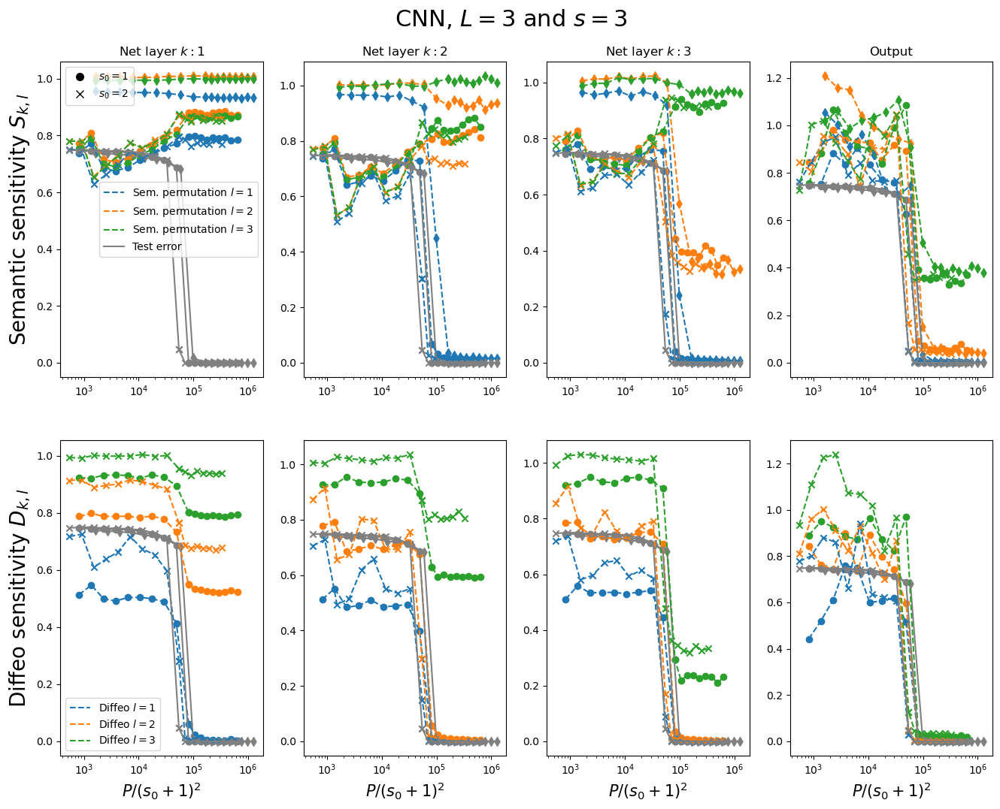

In [22]:
n=4

L=3
s=3
bs = 20
s0s = [0,1,2,4]#,2,4,6


colors = ['C'+str(gg) for gg in range(0,L)]#cm.rainbow(np.linspace(0, 1, L))

fig, axs = plt.subplots(2,(L+1), figsize = (16,12))
fig.suptitle(r"CNN, $L=3$ and $s=3$",fontsize =22,y=.94)
m = n**(s-1)
for idx_s0 in range(len(s0s)):
    try:
        s0 = s0s[idx_s0]
        
        if (L==3 and s==2) or (s==3 and n==4) or (s==4 and L==2)or (L==2 and s==3 and n==6):
            if s0>0:
                mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        else:
            if s0>0:
                mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            if (n==6 and s==2 and L==2):
                xx= training_point(net,s,s0,L,n,m)
            else:    
                xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
    except:
        pass

    
    
    if s0>0 and L==2 and s==2:
        xx =xx
    else:
        xx = xx*n
                            
    xx = xx/(s0+1)**2 



    
    if idx_s0==0:
        mar = "d"
    elif idx_s0==1:
        mar = "o"
    elif idx_s0==2:
        mar = "x"
    elif idx_s0==3:
        mar = "s"
    for k in range(L+1):
        
        for l in range(L):
            #print(mat_all[:,k,l])
            #print(s0s[idx_s0])
            #print(xx)
            #print(mat_all_sem[idx_s0,:len(xx),k,l])
            if idx_s0==0:
                axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],label =r"Sem. permutation $l=%d$" %(l+1),ls='--') 
                #axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],label =r"Diffeo $l=%d$" %(l+1),ls='--') 
            else: 
                axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],ls='--') 
                if idx_s0==1:
                    axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],label =r"Diffeo $l=%d$" %(l+1),ls='--') 
                else:
                    axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],ls='--') 
            if s0==0:
                axs[0,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
            else:
                axs[0,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                axs[1,k].scatter(xx, mat_all_pos[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
            #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
        if k==0 and idx_s0==0:
            axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey')
        else:
            axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
        axs[0,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
        axs[1,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
        
        axs[0,k].set_xscale("log")
        axs[1,k].set_xscale("log")
        axs[1,k].set_xlabel("$P/(s_0+1)^2$",size = 15)
        #axs[k].set_ylim(0,1)
        if k==0: 
            axs[0,0].set_ylabel(r"Semantic sensitivity $S_{k,l}$",size = 20)
            axs[0,0].legend()
            axs[1,0].set_ylabel(r"Diffeo sensitivity $D_{k,l}$",size = 20)
            axs[1,0].legend()
        if k<(L):
            axs[0,k].set_title(r"Net layer $k: %d$" %(k+1))
        else:
            axs[0,L].set_title("Output")
            
s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
              markersize=7, label=r'$s_0=0$')
s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
              markersize=7, label=r'$s_0=1$')
s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
              markersize=7, label=r'$s_0=2$')
s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
              markersize=7, label=r'$s_0=4$')
first_legend = axs[0,0].legend()
ax = axs[0,0].add_artist(first_legend)
axs[0,0].legend(handles=[s02,s03],loc = 'upper left')  


plt.savefig("figures/sens_cnn_L_%d_s_%d.png" %(L,s), bbox_inches='tight')
plt.savefig("figures/sens_cnn_L_%d_s_%d.pdf" %(L,s), bbox_inches='tight')

FileNotFoundError: [Errno 2] No such file or directory: 'mats/mat_pos_L_3_n_6_m_36_s0_0_s_3_cnn.pt'

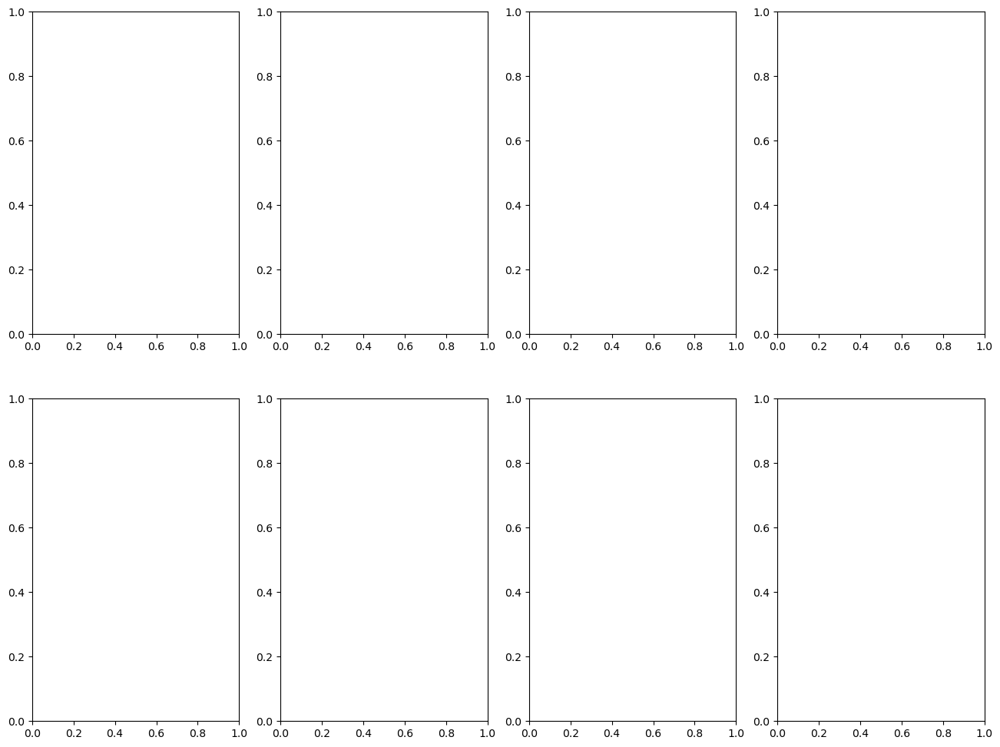

In [21]:
n=6
L=3
s=3
m = n**(s-1)
s0s = [0,1,2,4]#,2,4,6


colors = cm.rainbow(np.linspace(0, 1, L))

fig, axs = plt.subplots(2,(L+1), figsize = (16,12))
for idx_s0 in range(len(s0s)):
    s0 = s0s[idx_s0]
    mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
    mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
    mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
    xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
    print(xx)    
    if idx_s0==0:
        mar = "d"
    elif idx_s0==1:
        mar = "o"
    elif idx_s0==2:
        mar = "x"
    elif idx_s0==3:
        mar = "s"
    for k in range(L+1):
        for l in range(L):
            #print(mat_all[:,k,l])
            #print(s0s[idx_s0])
            #print(xx)
            #print(mat_all_sem[idx_s0,:len(xx),k,l])
            if idx_s0==0:
                axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
            else: 
                axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],ls='--') 
            axs[0,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
            #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
        if idx_s0==0:
            axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
        else:
            axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
        axs[0,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
        axs[0,k].set_xscale("log")
        #axs[k].set_yscale("log")
        axs[0,k].set_xlabel("P",size = 15)
        #axs[k].set_ylim(0,1)
        if k==0: 
            axs[0,0].set_ylabel("Semantic sensitivity $S_{k,l}$",size = 20)
            axs[0,0].legend()
        if k<(L):
            axs[0,k].set_title("net layer: %d" %(k+1))
        else:
            axs[0,L].set_title("Output")
            
s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
              markersize=7, label=r'$s_0=0$')
s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
              markersize=7, label=r'$s_0=1$')
s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
              markersize=7, label=r'$s_0=2$')
s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
              markersize=7, label=r'$s_0=4$')
first_legend = axs[0,0].legend()
ax = axs[0,0].add_artist(first_legend)
axs[0,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  

#plt.savefig("sens_sem_L%d_n%d_0s.pdf" %(L,n))
#plt.savefig("sens_sem_L%d_n%d_0s.png" %(L,n), bbox_inches='tight')

#fig, axs = plt.subplots(1,(L+1), figsize = (16,4))
for idx_s0 in range(len(s0s)):
    s0 = s0s[idx_s0]
    mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
    mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
    mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
    xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
    
    xx = xx/(s0s[idx_s0]+1)**(2)
    
    if idx_s0==0:
        mar = "d"
    elif idx_s0==1:
        mar = "o"
    elif idx_s0==2:
        mar = "x"
    elif idx_s0==3:
        mar = "s"
    for k in range(L+1):
        for l in range(L):
            #print(mat_all[:,k,l])
            if idx_s0==0:
                axs[1,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
            else: 
                axs[1,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],ls='--') 
            axs[1,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
            #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
        if idx_s0==0:
            axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
        else:
            axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
        axs[1,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
        axs[1,k].set_xscale("log")
        #axs[k].set_yscale("log")
        axs[1,k].set_xlabel(r"$P/(s_0+1)^{2}$",size = 15)
        #axs[k].set_ylim(0,1)
        if k==0: 
            axs[1,0].set_ylabel("Semantic sensitivity $S_{k,l}$",size = 20)
            #axs[1,0].legend()
        if k<(L):
            axs[1,k].set_title("net layer: %d" %(k+1))
        else:
            axs[1,L].set_title("Output")
            
s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
              markersize=7, label=r'$s_0=0$')
s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
              markersize=7, label=r'$s_0=1$')
s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
              markersize=7, label=r'$s_0=2$')
s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
              markersize=7, label=r'$s_0=4$')
first_legend = axs[1,0].legend()
ax = axs[1,0].add_artist(first_legend)
axs[1,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  
#plt.savefig("figures/sens_sem_L%d_n%d_0s_cnn.png" %(L,n), bbox_inches='tight')

V=3
tensor([])
tensor([  27,   39,   57,   83,  121,  176,  256,  374,  544,  792, 1154, 1680,
        2446, 3561])
tensor([   27,    42,    68,   108,   171,   272,   432,   687,  1091,  1733,
         2751,  4369,  6938, 11018])
tensor([   27,    47,    84,   150,   265,   471,   834,  1478,  2619,  4641,
         8222, 14567, 25807, 45721])
V=4
tensor([  12,   16,   28,   44,   72,  112,  176,  276,  432,  676, 1064, 1664,
        2608, 4084])
tensor([   63,    95,   141,   210,   312,   463,   689,  1023,  1521,  2261,
         3360,  4993,  7419, 11025])
tensor([   63,   103,   168,   272,   441,   716,  1160,  1881,  3049,  4942,
         8011, 12984, 21047, 34114])
tensor([   63,   108,   185,   315,   537,   915,  1558,  2653,  4517,  7690,
        13093, 22291, 37950, 64610])
V=8
tensor([   96,   144,   232,   368,   576,   904,  1408,  2216,  3464,  5432,
         8512, 13328, 20872, 32688])
tensor([   512,    799,   1248,   1949,   3043,   4751,   7419,  11585,  18089,
     

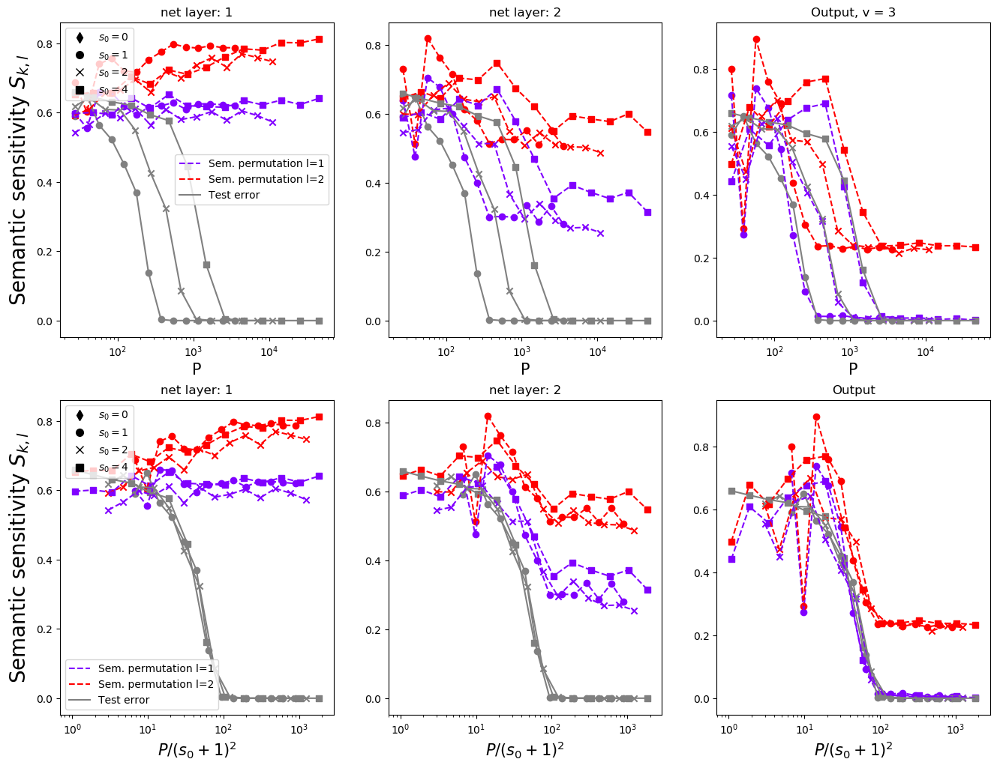

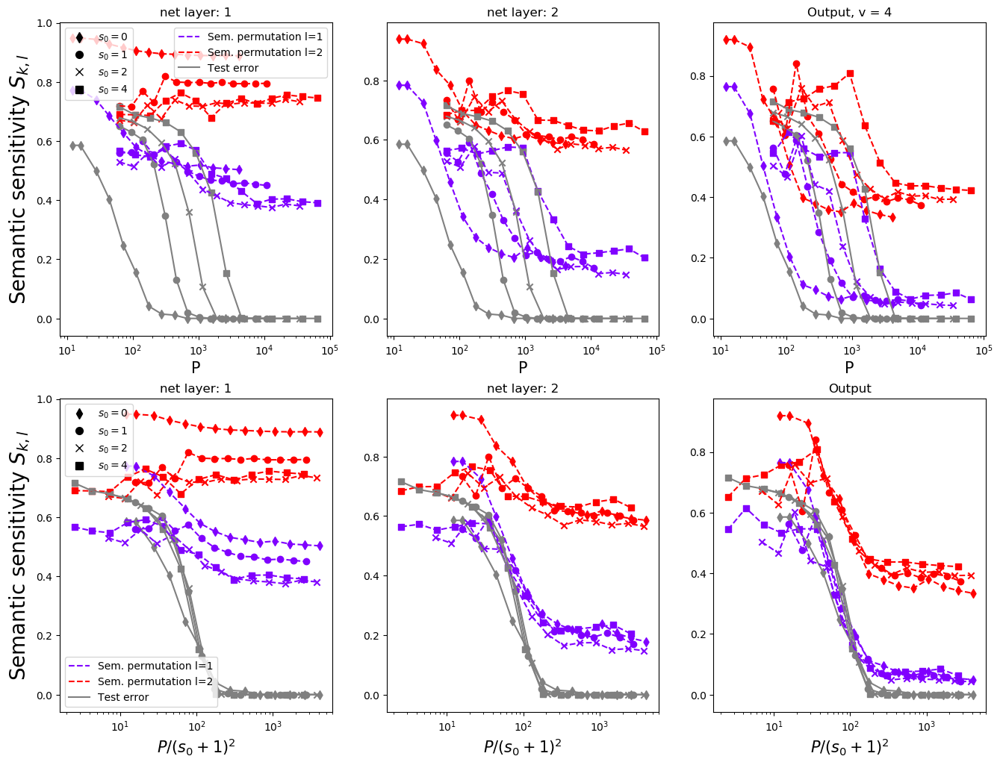

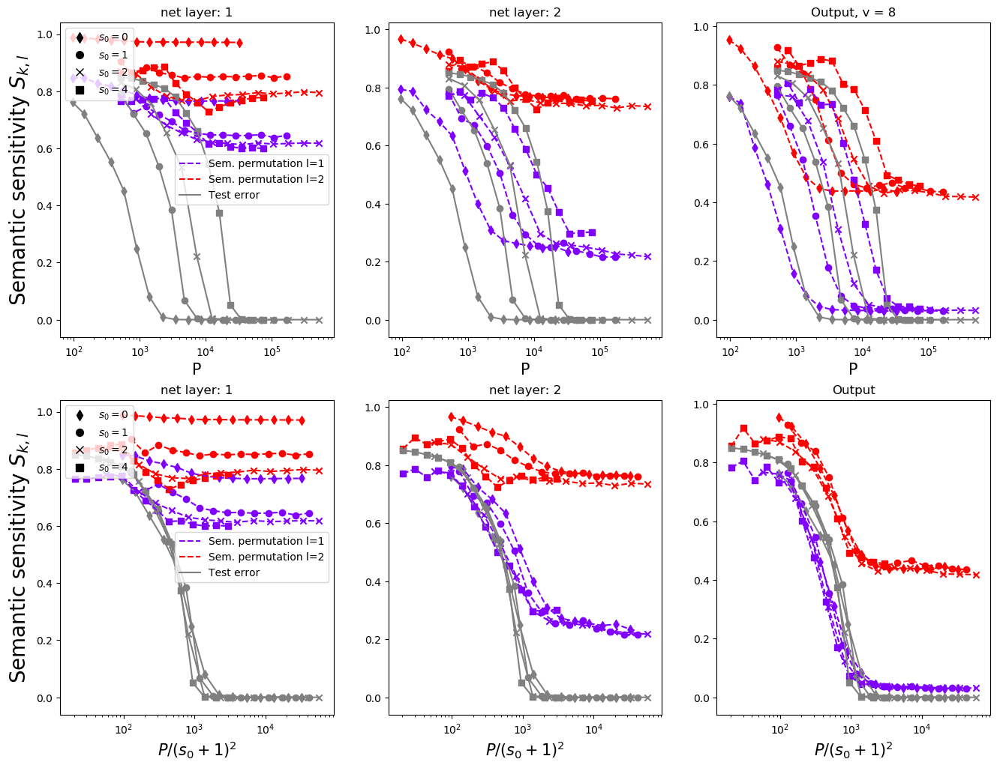

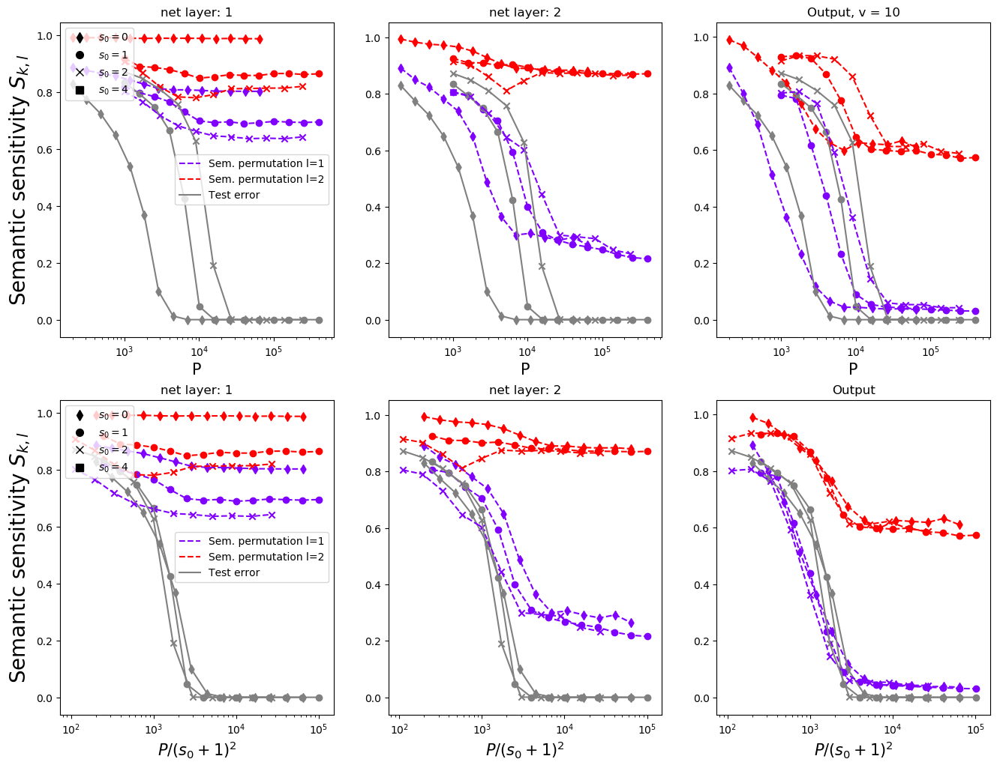

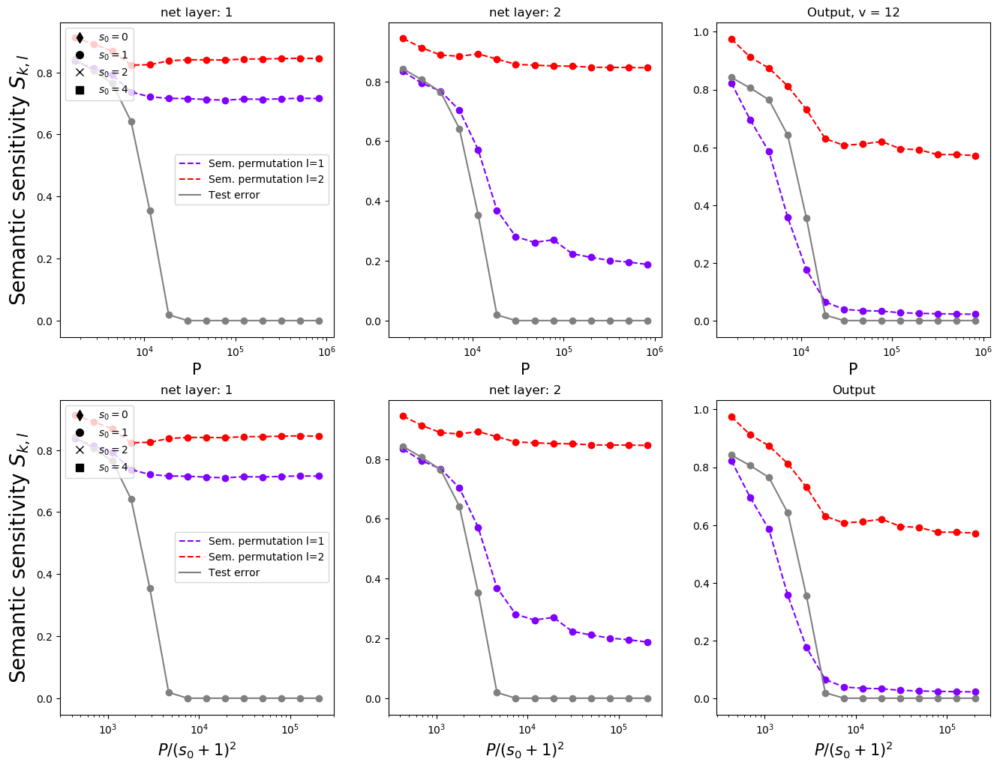

In [4]:
ns = [3,4,8,10,12]
L=2
s=2

s0s = [0,1,2,4]#,2,4,6


colors = cm.rainbow(np.linspace(0, 1, L))
for n in ns:
    print('V='+str(n))
    m = n**(s-1)
    fig, axs = plt.subplots(2,(L+1), figsize = (16,12))
    if n>=10:
        s0s = [0,1,2]
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        print(xx)    
        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        elif idx_s0==4:
            mar = "v"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                #print(s0s[idx_s0])
                #print(xx)
                #print(mat_all_sem[idx_s0,:len(xx),k,l])
                if idx_s0==0:
                    axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],ls='--') 
                axs[0,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[0,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[0,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[0,k].set_xlabel("P",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[0,0].set_ylabel("Semantic sensitivity $S_{k,l}$",size = 20)
                axs[0,0].legend()
            if k<(L):
                axs[0,k].set_title("net layer: %d" %(k+1))
            else:
                axs[0,L].set_title("Output, v = "+str(n))

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    #s05 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
    #              markersize=7, label=r'$s_0=6$')
    first_legend = axs[0,0].legend()
    ax = axs[0,0].add_artist(first_legend)
    axs[0,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  

    #plt.savefig("sens_sem_L%d_n%d_0s.pdf" %(L,n))
    #plt.savefig("sens_sem_L%d_n%d_0s.png" %(L,n), bbox_inches='tight')

    #fig, axs = plt.subplots(1,(L+1), figsize = (16,4))
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        xx = xx/(s0s[idx_s0]+1)**(2)

        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        elif idx_s0==4:
            mar = "v"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                if idx_s0==0:
                    axs[1,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[1,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],ls='--') 
                axs[1,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[1,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[1,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[1,k].set_xlabel(r"$P/(s_0+1)^{2}$",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[1,0].set_ylabel("Semantic sensitivity $S_{k,l}$",size = 20)
                #axs[1,0].legend()
            if k<(L):
                axs[1,k].set_title("net layer: %d" %(k+1))
            else:
                axs[1,L].set_title("Output")

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    #s05 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
    #              markersize=7, label=r'$s_0=6$')
    first_legend = axs[1,0].legend()
    ax = axs[1,0].add_artist(first_legend)
    axs[1,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  
    #plt.savefig("figures/sens_sem_L%d_n%d_0s_cnn.png" %(L,n), bbox_inches='tight')

V=3
tensor([])
tensor([])
tensor([])
tensor([])
V=4
tensor([])
tensor([ 1024,  1420,  1976,  2744,  3816,  5300,  7368, 10240, 14228, 19768,
        27468, 38168, 53036, 73692])
tensor([ 1024,  1420,  1976,  2744,  3816,  5300,  7368, 10240, 14228, 19768,
        27468, 38168, 53036, 73692])
tensor([  1024,   1536,   2312,   3476,   5224,   7852,  11800,  17736,  26656,
         40060,  60208,  90488, 136000, 204400])
V=8
tensor([])
tensor([   3272,    5816,   10352,   18416,   32760,   45528,   63264,   87904,
         122144,  169720,  235824,  327672,  455304,  632648,  879064, 1221456,
        1697208, 2358264])
tensor([  32760,   45528,   63264,   87904,  122144,  169720,  235824,  327672,
         455304,  632648,  879064, 1221456, 1697208, 2358264])
tensor([  32760,   49240,   74008,  111240,  167184,  251264,  377632,  567552,
         852992, 1281984, 1926736, 2895736])
V=10
tensor([])
tensor([  10000,   17780,   31620,   56230,  100000,  138940,  193060,  268260,
         372

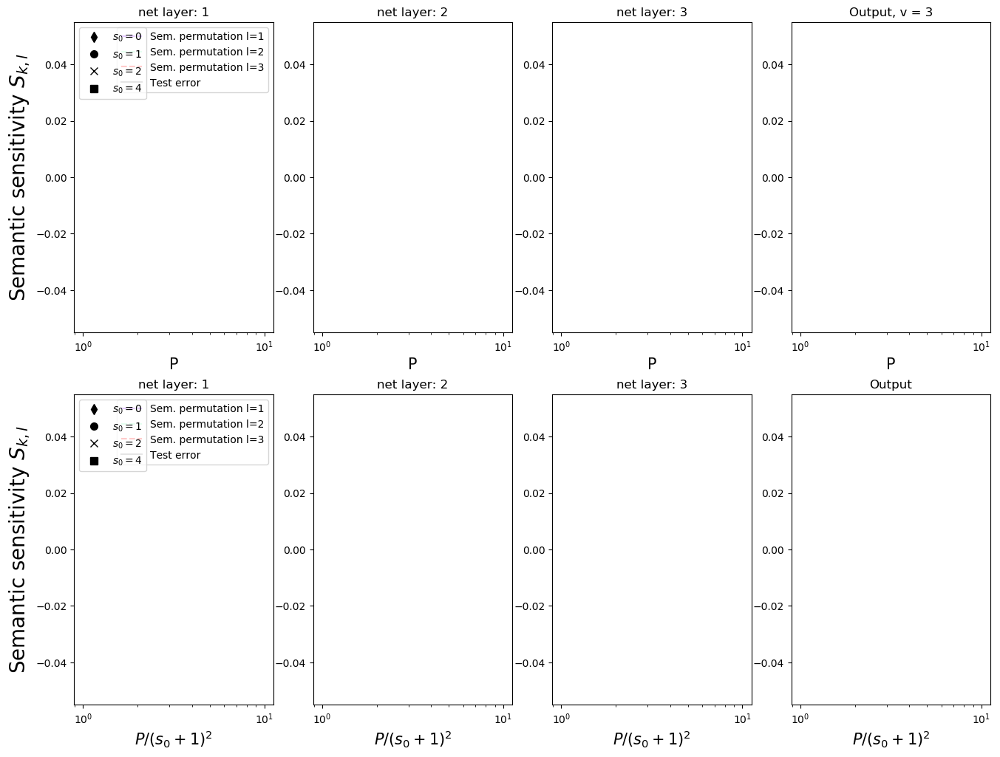

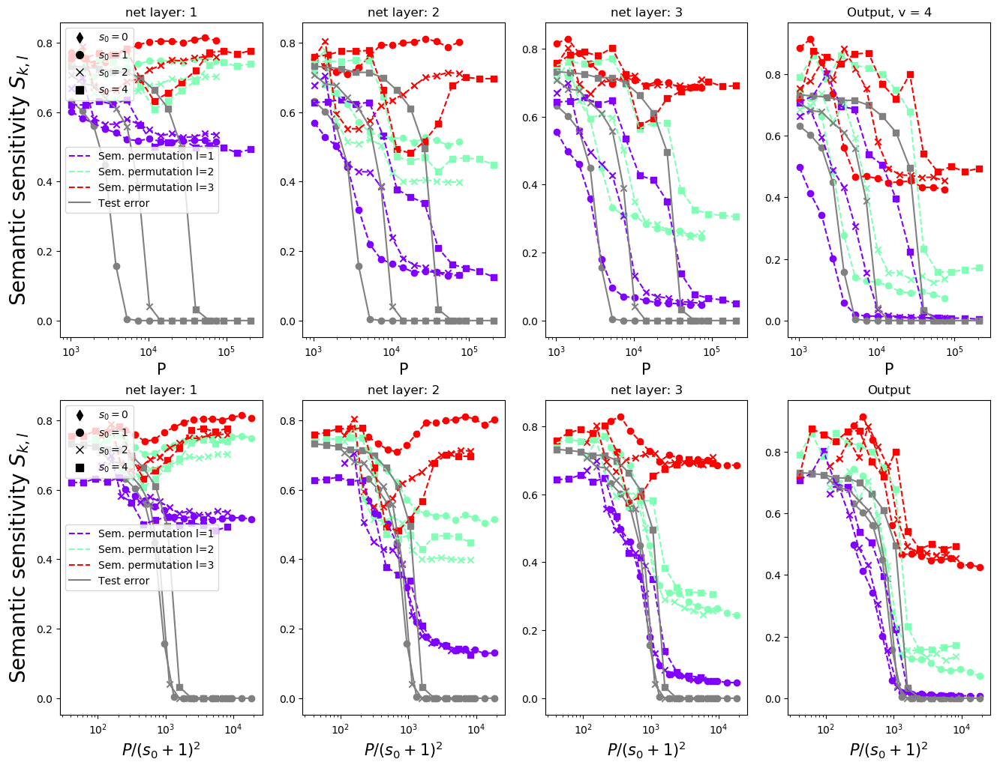

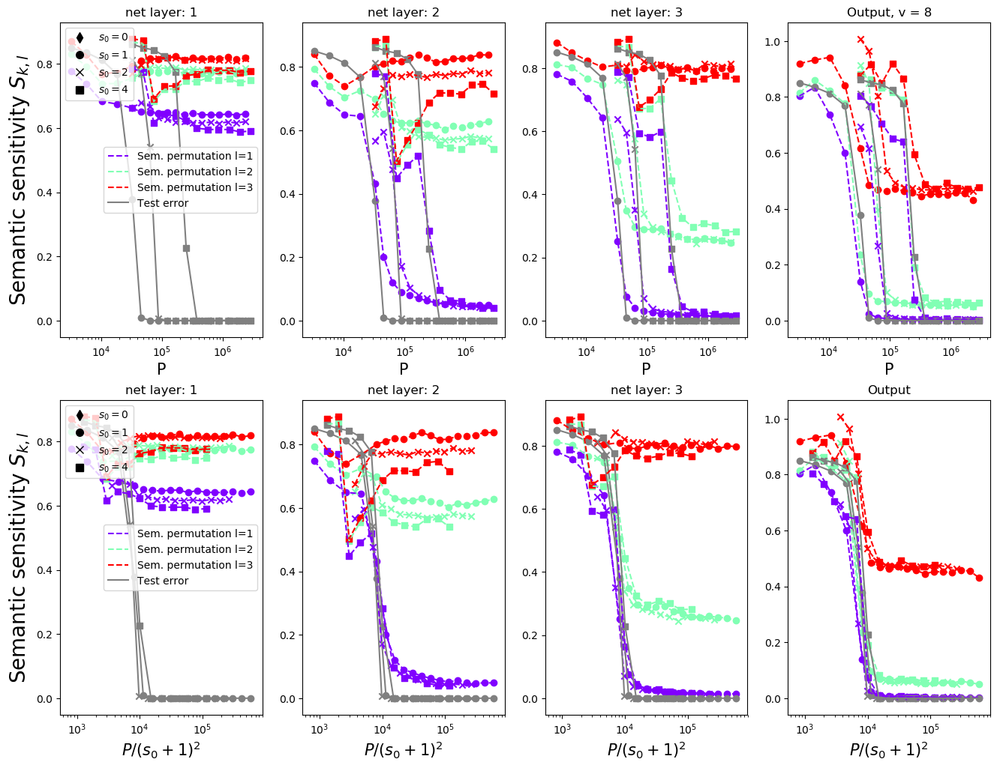

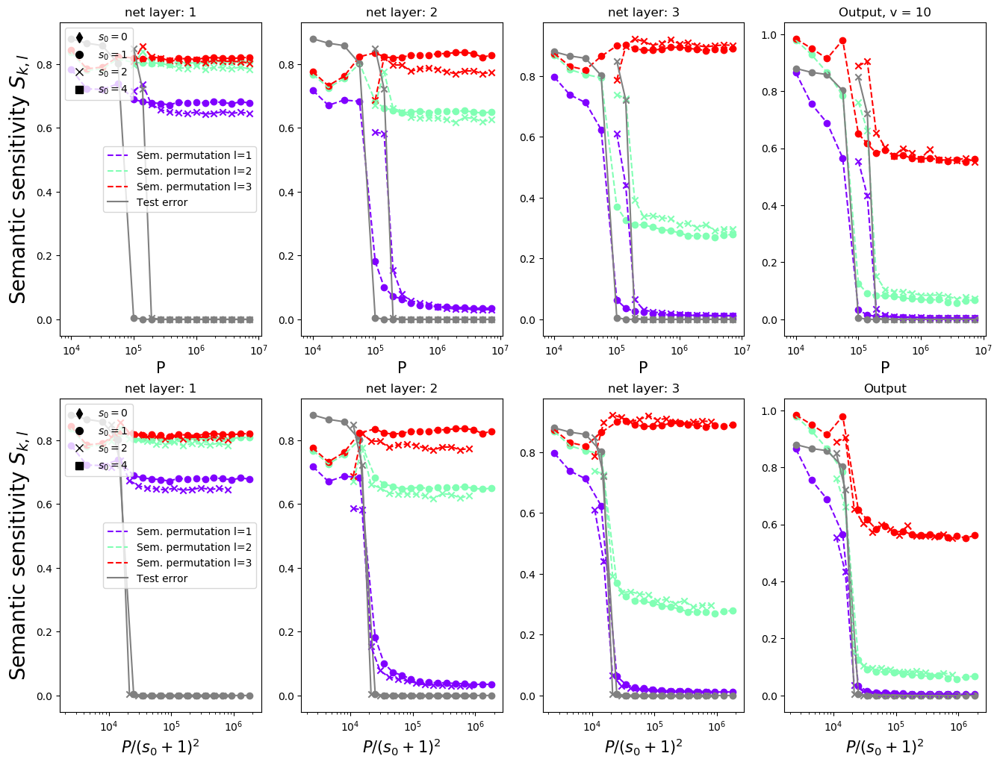

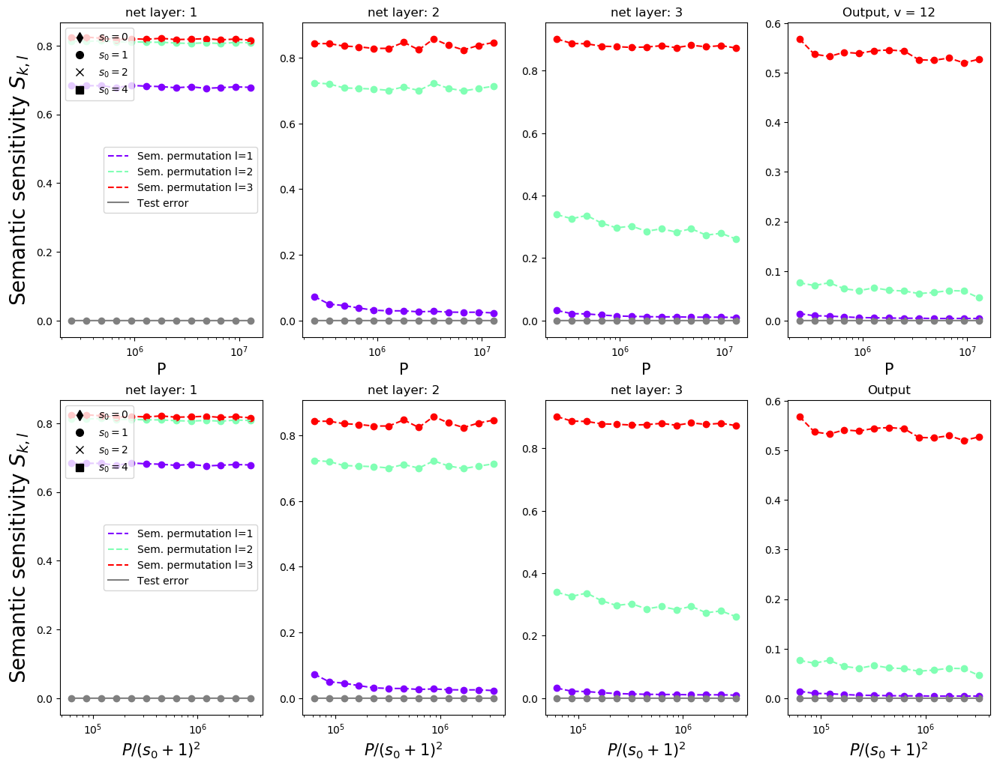

In [7]:
ns = [3,4,8,10,12]
L=3
s=2

s0s = [0,1,2,4]#,2,4,6

bs = 20

colors = cm.rainbow(np.linspace(0, 1, L))
for n in ns:
    print('V='+str(n))
    m = n**(s-1)
    fig, axs = plt.subplots(2,(L+1), figsize = (16,12))
    if n>=10:
        s0s = [0,1,2]
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        
        if (L==3 and s==2) or (s==3 and v==4) or (s==4 and L==2):
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        else:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        print(xx)    
        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                #print(s0s[idx_s0])
                #print(xx)
                #print(mat_all_sem[idx_s0,:len(xx),k,l])
                if idx_s0==0:
                    axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],ls='--') 
                axs[0,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[0,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[0,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[0,k].set_xlabel("P",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[0,0].set_ylabel("Semantic sensitivity $S_{k,l}$",size = 20)
                axs[0,0].legend()
            if k<(L):
                axs[0,k].set_title("net layer: %d" %(k+1))
            else:
                axs[0,L].set_title("Output, v = "+str(n))

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    first_legend = axs[0,0].legend()
    ax = axs[0,0].add_artist(first_legend)
    axs[0,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  

    #plt.savefig("sens_sem_L%d_n%d_0s.pdf" %(L,n))
    #plt.savefig("sens_sem_L%d_n%d_0s.png" %(L,n), bbox_inches='tight')

    #fig, axs = plt.subplots(1,(L+1), figsize = (16,4))
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        if (L==3 and s==2) or (s==3 and v==4) or (s==4 and L==2):
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        else:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        xx = xx/(s0s[idx_s0]+1)**(2)

        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                if idx_s0==0:
                    axs[1,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[1,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],ls='--') 
                axs[1,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[1,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[1,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[1,k].set_xlabel(r"$P/(s_0+1)^{2}$",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[1,0].set_ylabel("Semantic sensitivity $S_{k,l}$",size = 20)
                #axs[1,0].legend()
            if k<(L):
                axs[1,k].set_title("net layer: %d" %(k+1))
            else:
                axs[1,L].set_title("Output")

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    first_legend = axs[1,0].legend()
    ax = axs[1,0].add_artist(first_legend)
    axs[1,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  
    #plt.savefig("figures/sens_sem_L%d_n%d_0s_cnn.png" %(L,n), bbox_inches='tight')

V=4
tensor([  100,   164,   276,   464,   780,  1308,  2188,  3660,  6120, 10240,
        10240, 13224, 17080, 22060, 28492, 36800, 47528, 61384])
tensor([   50,    85,   142,   237,   395,   660,  1101,  1838,  3068,  5120,
         5120,  6612,  8540, 11030, 14246, 18400, 23764, 30693, 39642])
tensor([   76,   126,   211,   353,   591,   987,  1648,  2753,  4598,  7679,
         7679,  9919, 12811, 16546, 21370, 27600, 35647, 46040, 59463])
tensor([  127,   213,   356,   594,   991,  1653,  2757,  4600,  7673, 12800,
        12800, 16531, 21351, 27576, 35616, 46000, 59412, 76733, 99105])
V=6
tensor([    216,     300,     414,     576,     804,    1116,    1554,    2160,
           3000,    4170,    5790,    8046,   11184,   15540,   21600,   24228,
          27180,   30492,   34206,   38376,   43050,   48294,   54180,   60780,
          68184,   76494,   85812,   96270,  108000,  113478,  119238,  125292,
         131652,  138330,  145356,  152730,  160482,  168630,  177192,  186186,

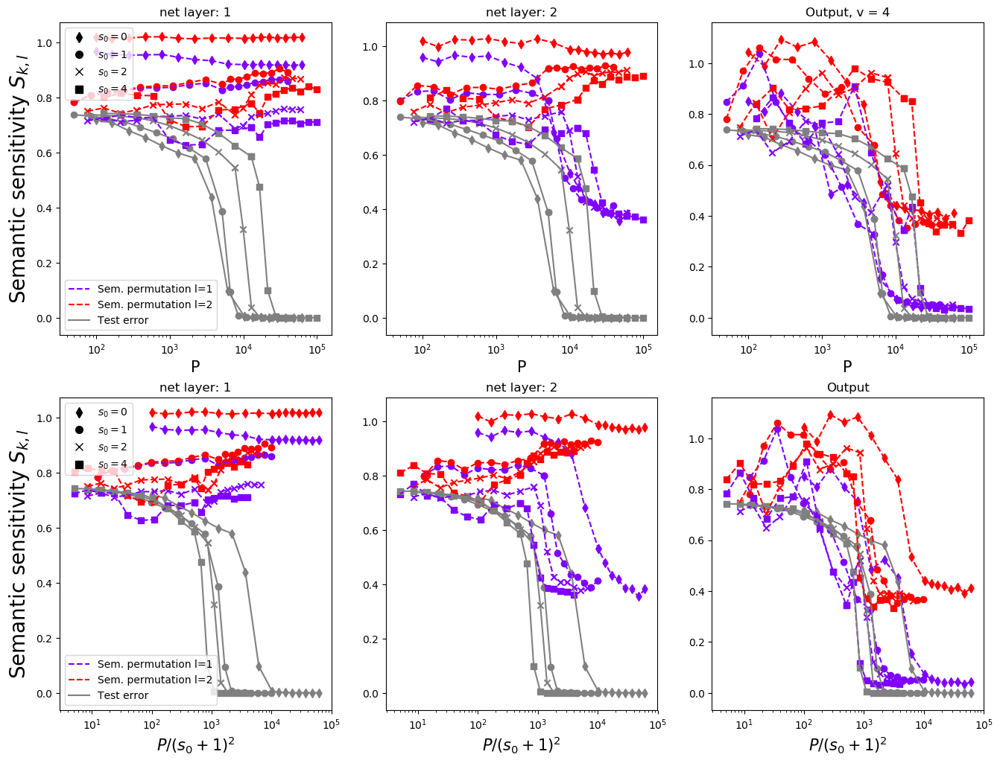

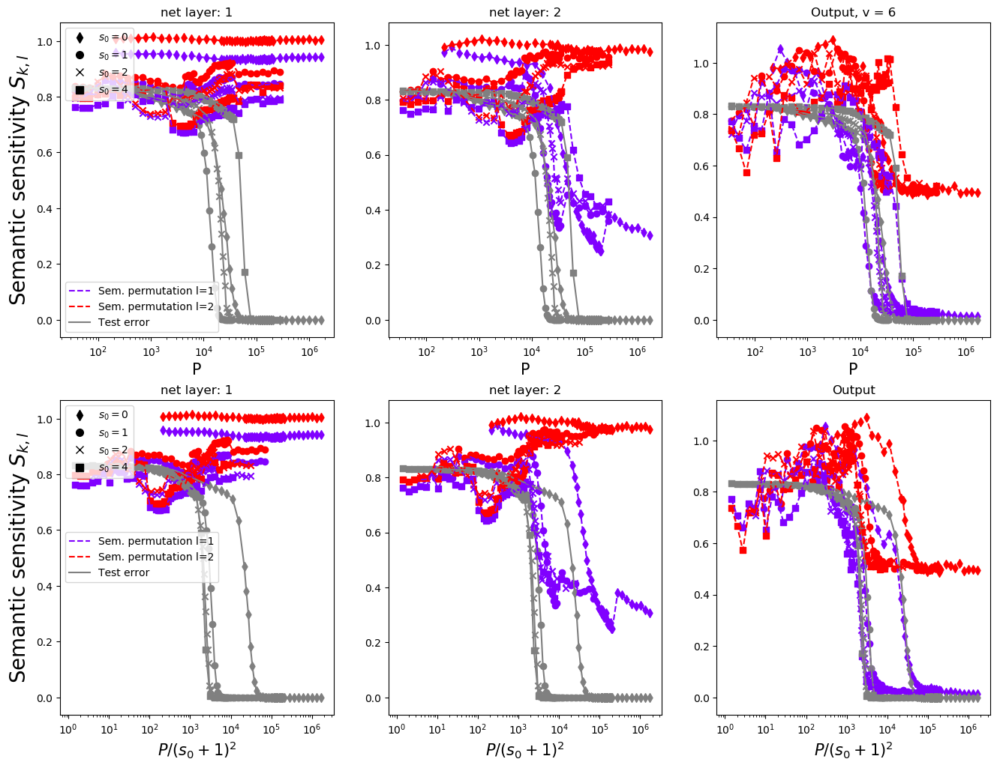

In [4]:
ns = [4,6]
L=2
s=3

s0s = [0,1,2,4]#,2,4,6

bs = 20

colors = cm.rainbow(np.linspace(0, 1, L))
for n in ns:
    print('V='+str(n))
    m = n**(s-1)
    fig, axs = plt.subplots(2,(L+1), figsize = (16,12))
    if n>=10:
        s0s = [0,1,2]
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        
        if (L==3 and s==2) or (s==3 and n==4) or (s==4 and L==2):
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        else:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        print(xx)    
        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                #print(s0s[idx_s0])
                #print(xx)
                #print(mat_all_sem[idx_s0,:len(xx),k,l])
                if idx_s0==0:
                    axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],ls='--') 
                axs[0,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[0,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[0,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[0,k].set_xlabel("P",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[0,0].set_ylabel("Semantic sensitivity $S_{k,l}$",size = 20)
                axs[0,0].legend()
            if k<(L):
                axs[0,k].set_title("net layer: %d" %(k+1))
            else:
                axs[0,L].set_title("Output, v = "+str(n))

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    first_legend = axs[0,0].legend()
    ax = axs[0,0].add_artist(first_legend)
    axs[0,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  

    #plt.savefig("sens_sem_L%d_n%d_0s.pdf" %(L,n))
    #plt.savefig("sens_sem_L%d_n%d_0s.png" %(L,n), bbox_inches='tight')

    #fig, axs = plt.subplots(1,(L+1), figsize = (16,4))
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        if (L==3 and s==2) or (s==3 and n==4) or (s==4 and L==2):
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        else:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        xx = xx/(s0s[idx_s0]+1)**(2)

        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                if idx_s0==0:
                    axs[1,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[1,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],ls='--') 
                axs[1,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[1,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[1,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[1,k].set_xlabel(r"$P/(s_0+1)^{2}$",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[1,0].set_ylabel("Semantic sensitivity $S_{k,l}$",size = 20)
                #axs[1,0].legend()
            if k<(L):
                axs[1,k].set_title("net layer: %d" %(k+1))
            else:
                axs[1,L].set_title("Output")

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    first_legend = axs[1,0].legend()
    ax = axs[1,0].add_artist(first_legend)
    axs[1,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  
    #plt.savefig("figures/sens_sem_L%d_n%d_0s_cnn.png" %(L,n), bbox_inches='tight')

V=4
tensor([   1636,    2728,    4552,    7596,   12672,   21144,   35280,   58860,
          98200,  163836,  163836,  211604,  273300,  352980,  455892,  588808,
         760476,  982192, 1268552])
tensor([   3276,    5464,    9116,   15204,   25364,   42316,   70588,  117752,
         196432,  327676,  327676,  423212,  546600,  705964,  911788, 1177620,
        1520952, 1964388, 2537104])
tensor([   4912,    8192,   13668,   22804,   38040,   63460,  105868,  176616,
         294636,  491520,  491520,  634820,  819904, 1058944, 1367680, 1766428,
        2281432, 2946584])
tensor([])


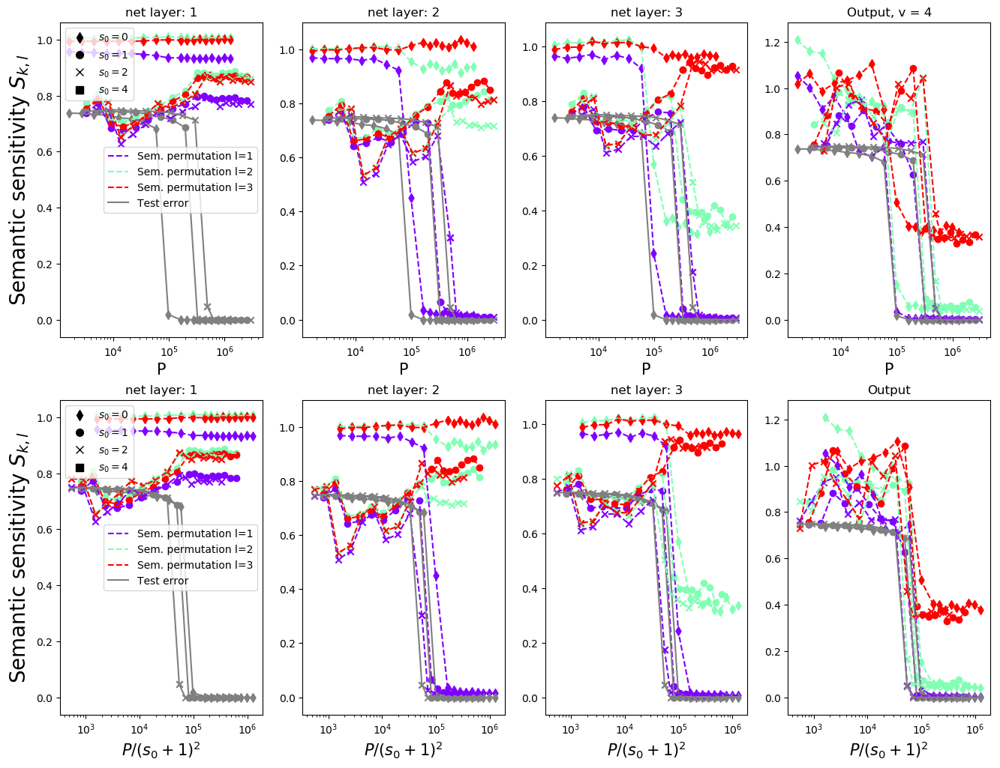

In [11]:
ns = [4]
L=3
s=3

s0s = [0,1,2,4]#,2,4,6

bs = 20

colors = cm.rainbow(np.linspace(0, 1, L))
for n in ns:
    print('V='+str(n))
    m = n**(s-1)
    fig, axs = plt.subplots(2,(L+1), figsize = (16,12))
    if n>=10:
        s0s = [0,1,2]
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        
        if (L==3 and s==2) or (s==3 and n==4) or (s==4 and L==2):
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        else:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        print(xx)    
        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                #print(s0s[idx_s0])
                #print(xx)
                #print(mat_all_sem[idx_s0,:len(xx),k,l])
                if idx_s0==0:
                    axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],ls='--') 
                axs[0,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[0,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[0,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[0,k].set_xlabel("P",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[0,0].set_ylabel("Semantic sensitivity $S_{k,l}$",size = 20)
                axs[0,0].legend()
            if k<(L):
                axs[0,k].set_title("net layer: %d" %(k+1))
            else:
                axs[0,L].set_title("Output, v = "+str(n))

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    first_legend = axs[0,0].legend()
    ax = axs[0,0].add_artist(first_legend)
    axs[0,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  

    #plt.savefig("sens_sem_L%d_n%d_0s.pdf" %(L,n))
    #plt.savefig("sens_sem_L%d_n%d_0s.png" %(L,n), bbox_inches='tight')

    #fig, axs = plt.subplots(1,(L+1), figsize = (16,4))
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        if (L==3 and s==2) or (s==3 and n==4) or (s==4 and L==2):
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        else:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        xx = xx/(s0s[idx_s0]+1)**(2)

        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                if idx_s0==0:
                    axs[1,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[1,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],ls='--') 
                axs[1,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[1,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[1,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[1,k].set_xlabel(r"$P/(s_0+1)^{2}$",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[1,0].set_ylabel("Semantic sensitivity $S_{k,l}$",size = 20)
                #axs[1,0].legend()
            if k<(L):
                axs[1,k].set_title("net layer: %d" %(k+1))
            else:
                axs[1,L].set_title("Output")

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    first_legend = axs[1,0].legend()
    ax = axs[1,0].add_artist(first_legend)
    axs[1,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  
    #plt.savefig("figures/sens_sem_L%d_n%d_0s_cnn.png" %(L,n), bbox_inches='tight')

V=6
tensor([     36,      50,      69,      96,     134,     186,     259,     360,
            500,     695,     965,    1341,    1864,    2590,    3600,    4038,
           4530,    5082,    5701,    6396,    7175,    8049,    9030,   10130,
          11364,   12749,   14302,   16045,   18000,   18913,   19873,   20882,
          21942,   23055,   24226,   25455,   26747,   28105,   29532,   31031,
          32606,   34261,   35999,   35999,   35999,   38882,   41995,   45357,
          48988,   52910,   57146,   61721,   66662,   71999,   71999,   86098,
         102957,  123118,  147226,  176055,  210529,  251753,  301050,  359999,
         359999,  430492,  514788,  615591,  736132,  880276, 1052646, 1258768,
        1505251])


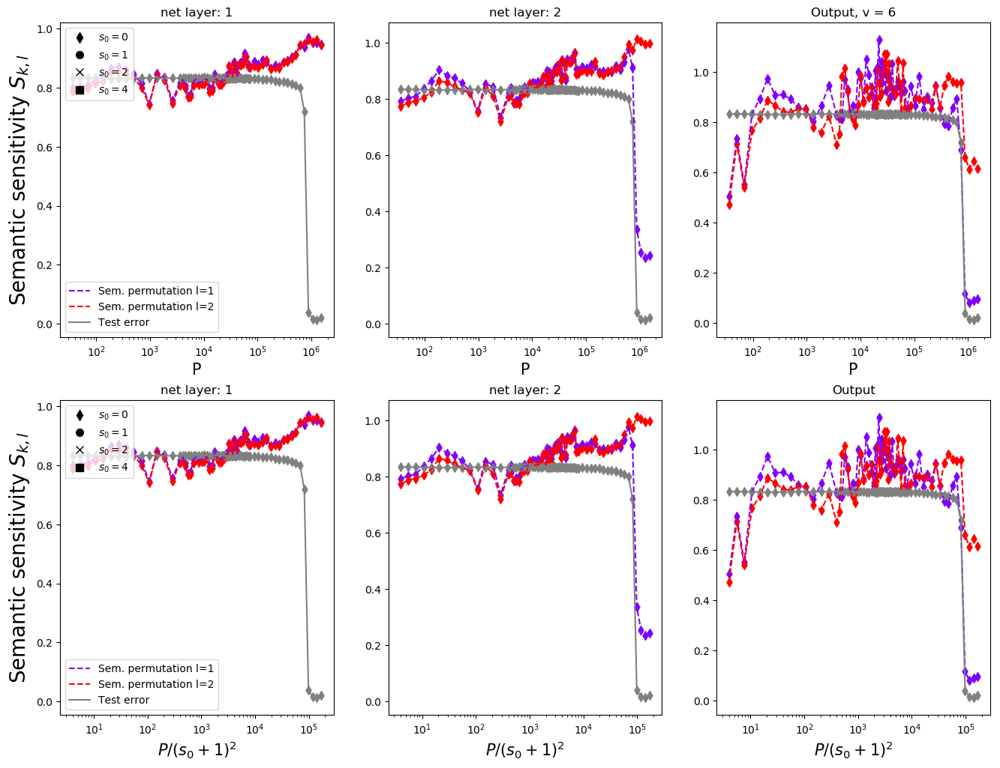

In [12]:
ns = [6]
L=2
s=4

s0s = [2]#,2,4,6

bs = 20

colors = cm.rainbow(np.linspace(0, 1, L))
for n in ns:
    print('V='+str(n))
    m = n**(s-1)
    fig, axs = plt.subplots(2,(L+1), figsize = (16,12))
    if n>=10:
        s0s = [0,1,2]
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        
        if (L==3 and s==2) or (s==3 and n==4) or (s==4 and L==2):
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        else:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        print(xx)    
        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                #print(s0s[idx_s0])
                #print(xx)
                #print(mat_all_sem[idx_s0,:len(xx),k,l])
                if idx_s0==0:
                    axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[0,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],ls='--') 
                axs[0,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[0,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[0,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[0,k].set_xlabel("P",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[0,0].set_ylabel("Semantic sensitivity $S_{k,l}$",size = 20)
                axs[0,0].legend()
            if k<(L):
                axs[0,k].set_title("net layer: %d" %(k+1))
            else:
                axs[0,L].set_title("Output, v = "+str(n))

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    first_legend = axs[0,0].legend()
    ax = axs[0,0].add_artist(first_legend)
    axs[0,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  

    #plt.savefig("sens_sem_L%d_n%d_0s.pdf" %(L,n))
    #plt.savefig("sens_sem_L%d_n%d_0s.png" %(L,n), bbox_inches='tight')

    #fig, axs = plt.subplots(1,(L+1), figsize = (16,4))
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        if (L==3 and s==2) or (s==3 and n==4) or (s==4 and L==2):
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        else:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        xx = xx/(s0s[idx_s0]+1)**(2)

        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                if idx_s0==0:
                    axs[1,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[1,k].plot(xx, mat_all_sem[:len(xx),k,l], color = colors[l],ls='--') 
                axs[1,k].scatter(xx, mat_all_sem[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[1,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[1,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[1,k].set_xlabel(r"$P/(s_0+1)^{2}$",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[1,0].set_ylabel("Semantic sensitivity $S_{k,l}$",size = 20)
                #axs[1,0].legend()
            if k<(L):
                axs[1,k].set_title("net layer: %d" %(k+1))
            else:
                axs[1,L].set_title("Output")

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    first_legend = axs[1,0].legend()
    ax = axs[1,0].add_artist(first_legend)
    axs[1,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  
    #plt.savefig("figures/sens_sem_L%d_n%d_0s_cnn.png" %(L,n), bbox_inches='tight')

In [6]:
#######################################################
#DIFFEO
######################################################

V=3
tensor([])
tensor([  27,   39,   57,   83,  121,  176,  256,  374,  544,  792, 1154, 1680,
        2446, 3561])
tensor([   27,    42,    68,   108,   171,   272,   432,   687,  1091,  1733,
         2751,  4369,  6938, 11018])
tensor([   27,    47,    84,   150,   265,   471,   834,  1478,  2619,  4641,
         8222, 14567, 25807, 45721])
V=4
tensor([  12,   16,   28,   44,   72,  112,  176,  276,  432,  676, 1064, 1664,
        2608, 4084])
tensor([   63,    95,   141,   210,   312,   463,   689,  1023,  1521,  2261,
         3360,  4993,  7419, 11025])
tensor([   63,   103,   168,   272,   441,   716,  1160,  1881,  3049,  4942,
         8011, 12984, 21047, 34114])
tensor([   63,   108,   185,   315,   537,   915,  1558,  2653,  4517,  7690,
        13093, 22291, 37950, 64610])
V=8
tensor([   96,   144,   232,   368,   576,   904,  1408,  2216,  3464,  5432,
         8512, 13328, 20872, 32688])
tensor([   512,    799,   1248,   1949,   3043,   4751,   7419,  11585,  18089,
     

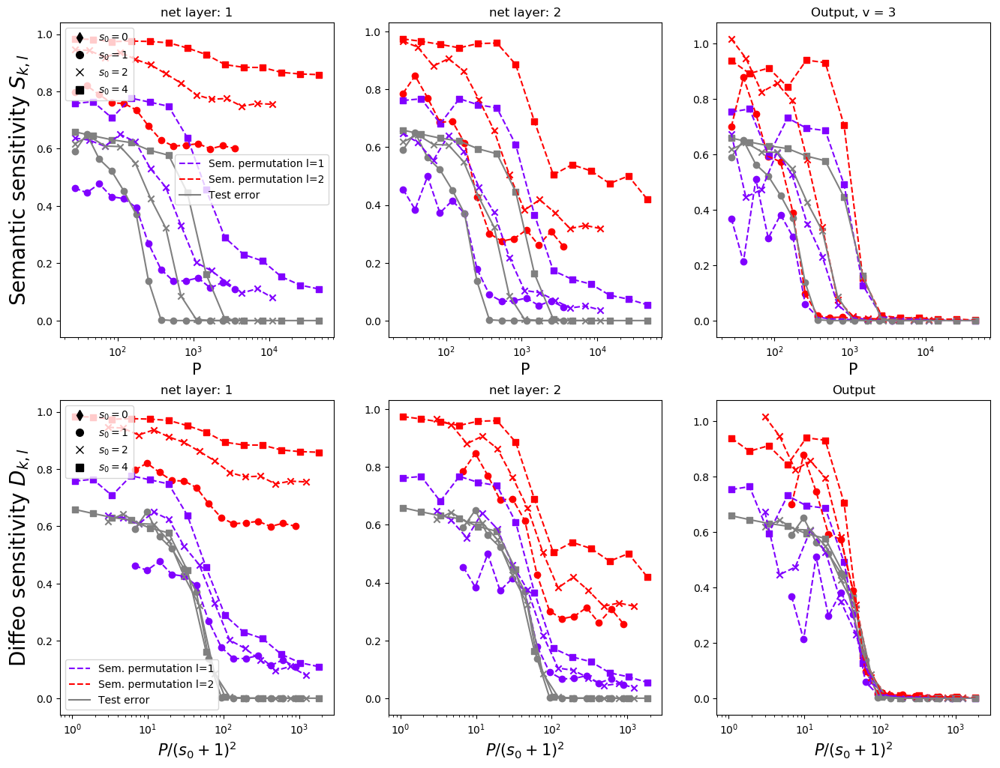

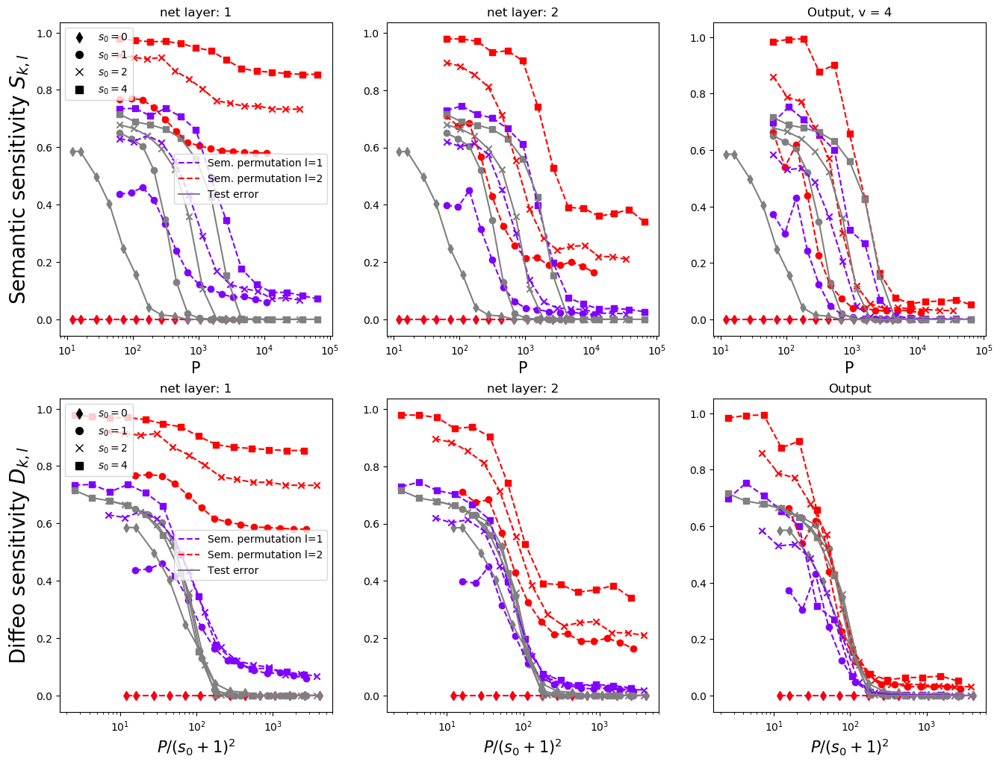

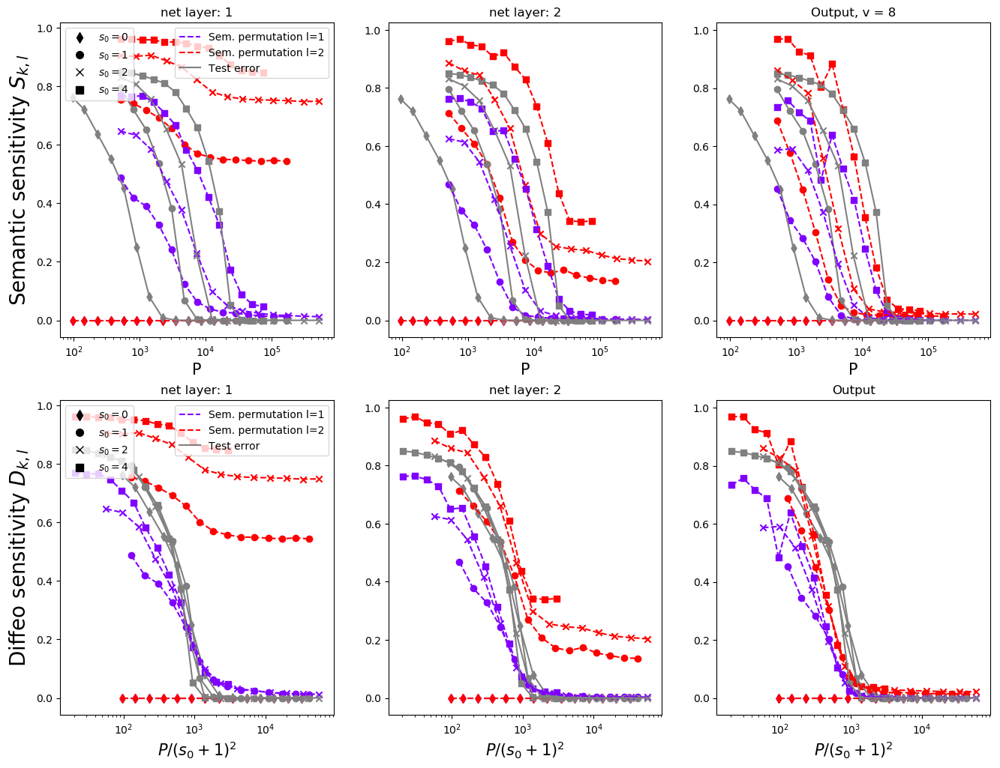

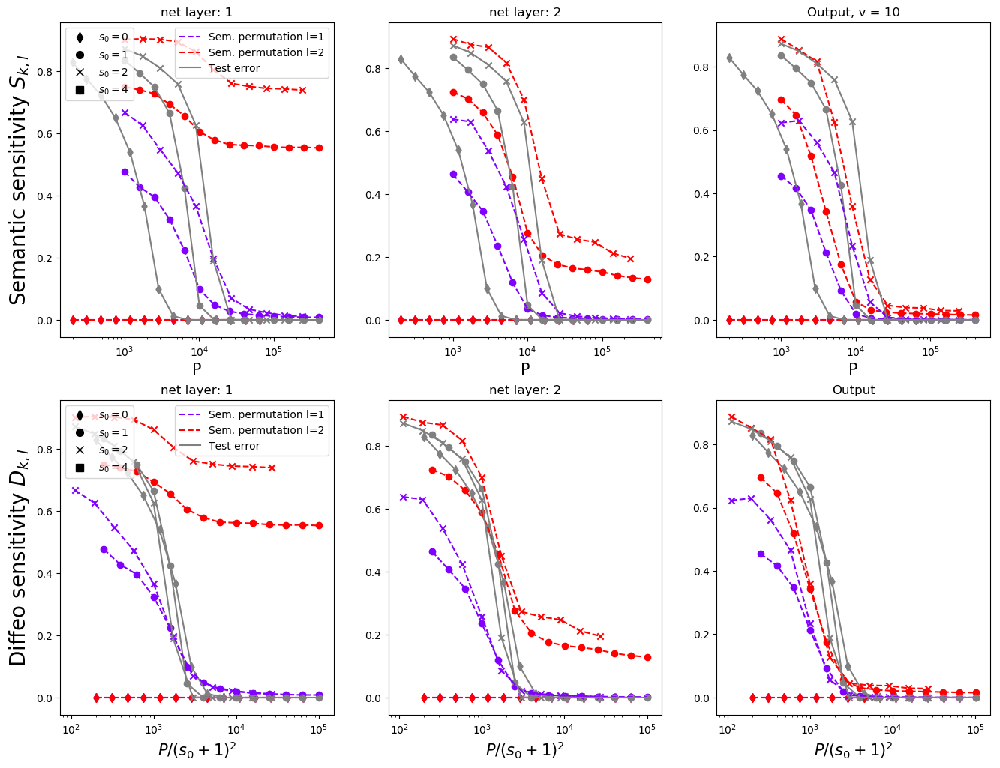

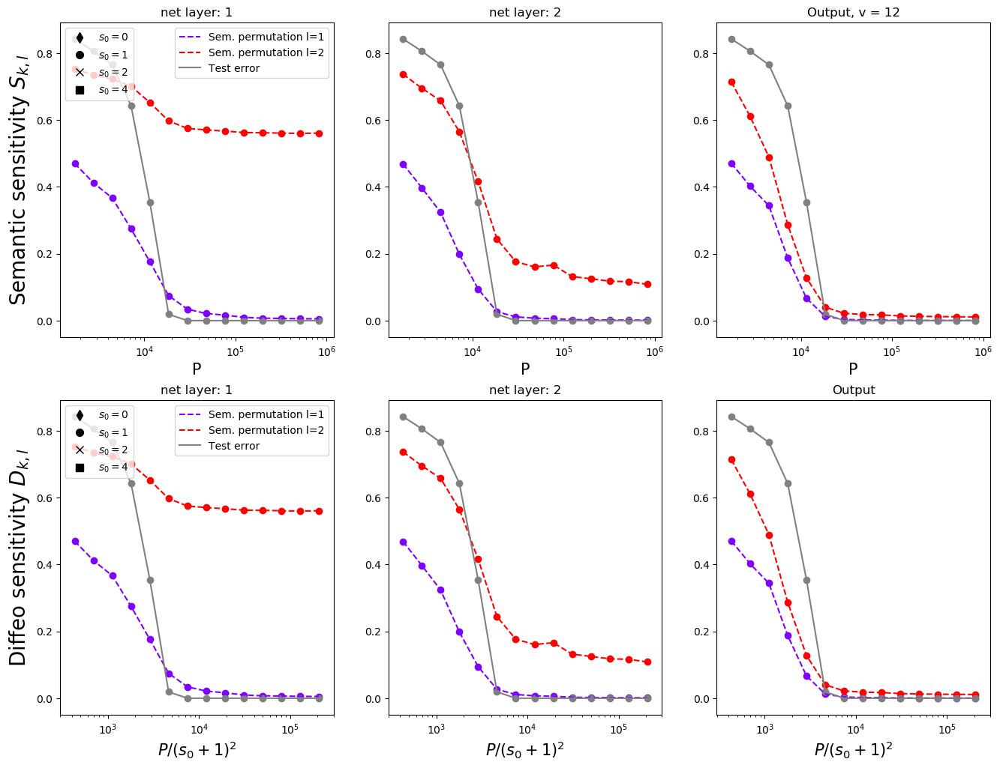

In [7]:
ns = [3,4,8,10,12]
L=2
s=2

s0s = [0,1,2,4]#,2,4,6

bs = 20

colors = cm.rainbow(np.linspace(0, 1, L))
for n in ns:
    print('V='+str(n))
    m = n**(s-1)
    fig, axs = plt.subplots(2,(L+1), figsize = (16,12))
    if n>=10:
        s0s = [0,1,2]
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        
        if (L==3 and s==2) or (s==3 and v==4) or (s==4 and L==2):
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        else:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        print(xx)    
        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                #print(s0s[idx_s0])
                #print(xx)
                #print(mat_all_sem[idx_s0,:len(xx),k,l])
                if idx_s0==0:
                    axs[0,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[0,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],ls='--') 
                axs[0,k].scatter(xx, mat_all_pos[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[0,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[0,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[0,k].set_xlabel("P",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[0,0].set_ylabel("Semantic sensitivity $S_{k,l}$",size = 20)
                axs[0,0].legend()
            if k<(L):
                axs[0,k].set_title("net layer: %d" %(k+1))
            else:
                axs[0,L].set_title("Output, v = "+str(n))

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    first_legend = axs[0,0].legend()
    ax = axs[0,0].add_artist(first_legend)
    axs[0,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  

    #plt.savefig("sens_sem_L%d_n%d_0s.pdf" %(L,n))
    #plt.savefig("sens_sem_L%d_n%d_0s.png" %(L,n), bbox_inches='tight')

    #fig, axs = plt.subplots(1,(L+1), figsize = (16,4))
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        if (L==3 and s==2) or (s==3 and v==4) or (s==4 and L==2):
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        else:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        xx = xx/(s0s[idx_s0]+1)**(2)

        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                if idx_s0==0:
                    axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],ls='--') 
                axs[1,k].scatter(xx, mat_all_pos[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[1,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[1,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[1,k].set_xlabel(r"$P/(s_0+1)^{2}$",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[1,0].set_ylabel("Diffeo sensitivity $D_{k,l}$",size = 20)
                #axs[1,0].legend()
            if k<(L):
                axs[1,k].set_title("net layer: %d" %(k+1))
            else:
                axs[1,L].set_title("Output")

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    first_legend = axs[1,0].legend()
    ax = axs[1,0].add_artist(first_legend)
    axs[1,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  
    #plt.savefig("figures/sens_sem_L%d_n%d_0s_cnn.png" %(L,n), bbox_inches='tight')

V=3
tensor([])
tensor([])
tensor([])
tensor([])
V=4
tensor([])
tensor([ 1024,  1420,  1976,  2744,  3816,  5300,  7368, 10240, 14228, 19768,
        27468, 38168, 53036, 73692])
tensor([ 1024,  1420,  1976,  2744,  3816,  5300,  7368, 10240, 14228, 19768,
        27468, 38168, 53036, 73692])
tensor([  1024,   1536,   2312,   3476,   5224,   7852,  11800,  17736,  26656,
         40060,  60208,  90488, 136000, 204400])
V=8
tensor([])
tensor([   3272,    5816,   10352,   18416,   32760,   45528,   63264,   87904,
         122144,  169720,  235824,  327672,  455304,  632648,  879064, 1221456,
        1697208, 2358264])
tensor([  32760,   45528,   63264,   87904,  122144,  169720,  235824,  327672,
         455304,  632648,  879064, 1221456, 1697208, 2358264])
tensor([  32760,   49240,   74008,  111240,  167184,  251264,  377632,  567552,
         852992, 1281984, 1926736, 2895736])
V=10
tensor([])
tensor([  10000,   17780,   31620,   56230,  100000,  138940,  193060,  268260,
         372

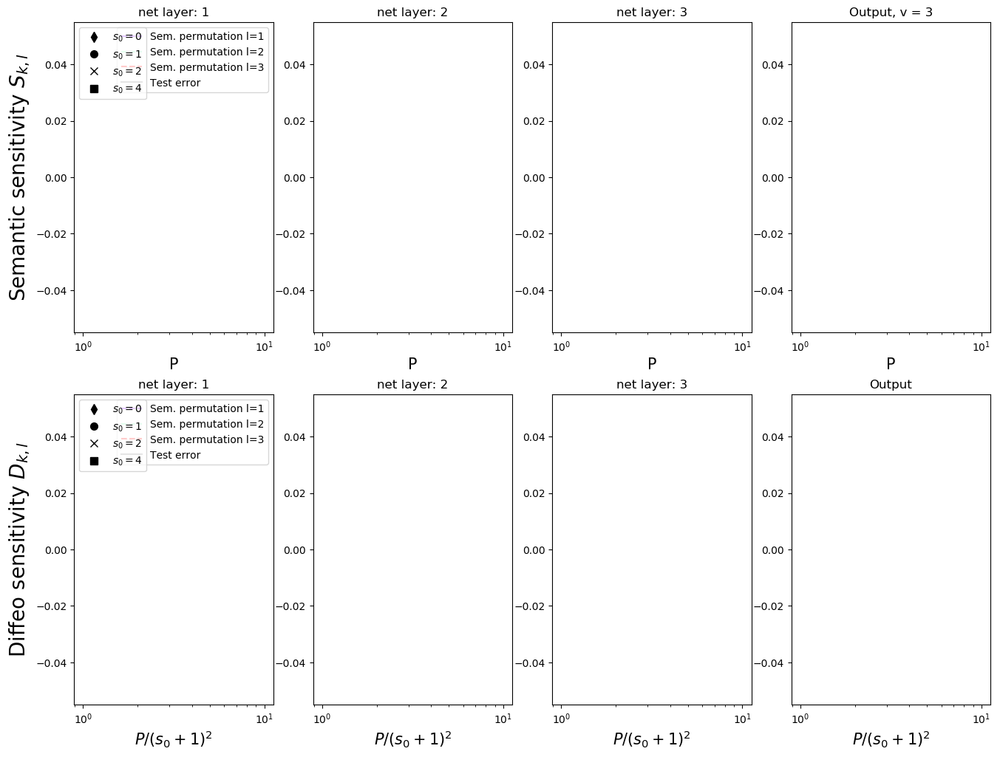

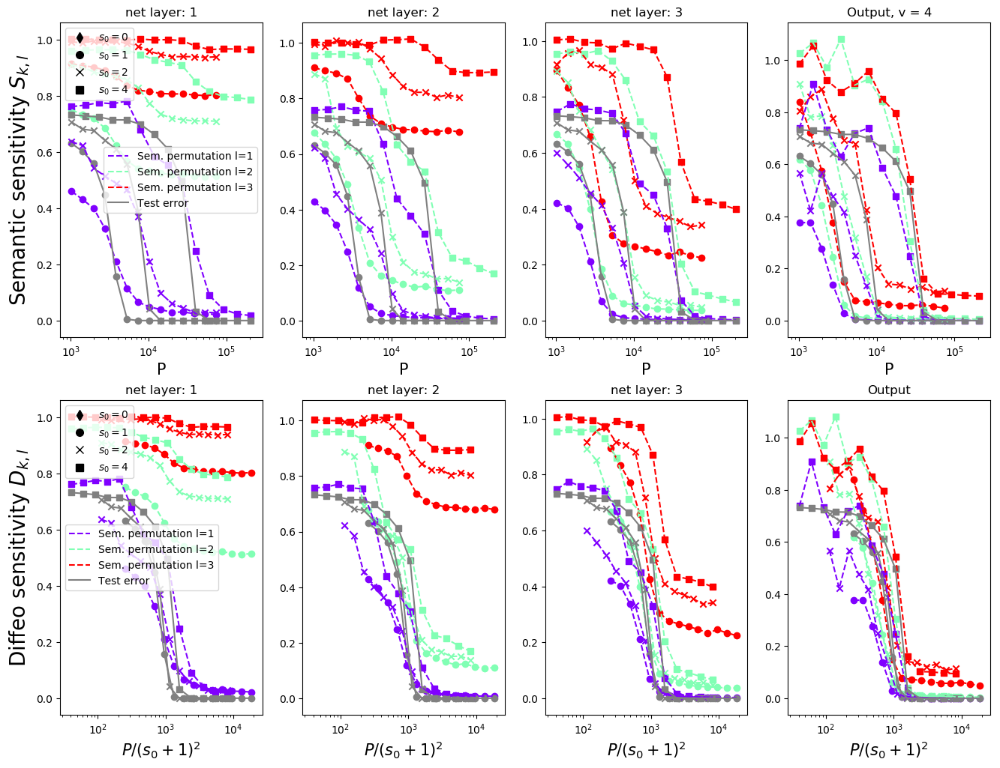

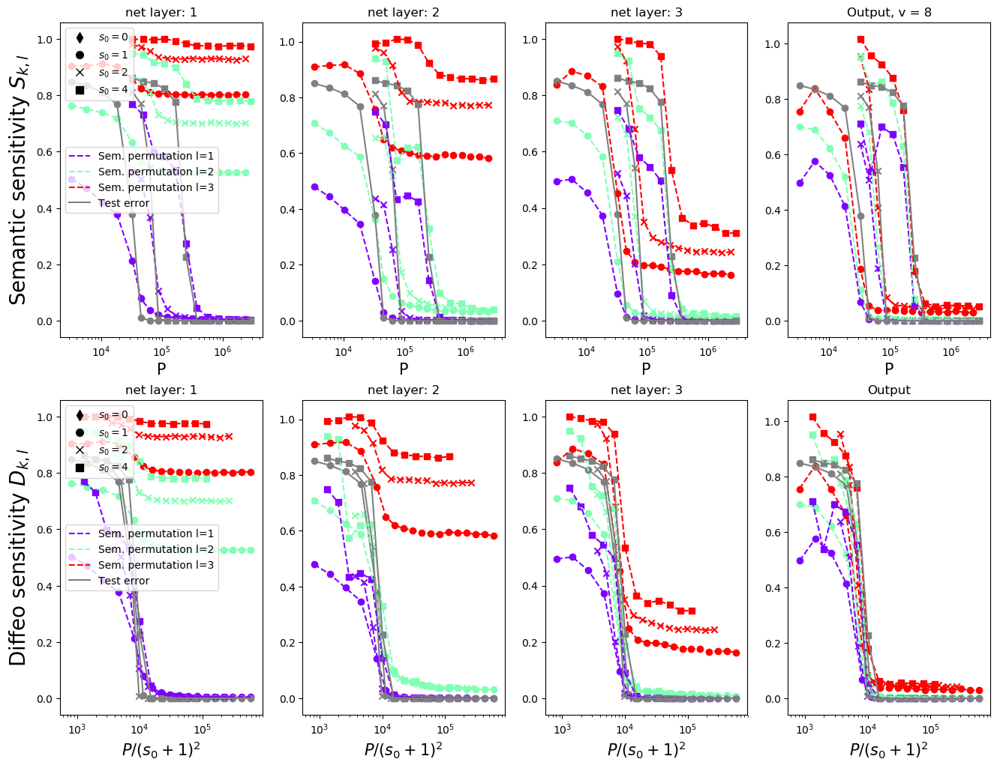

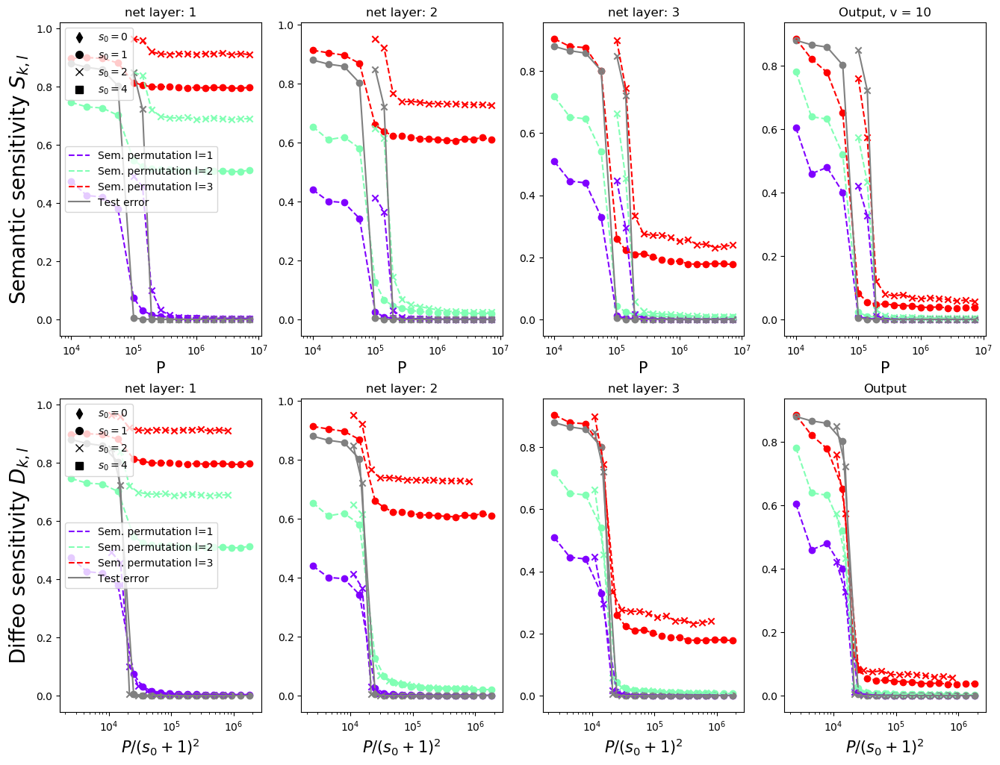

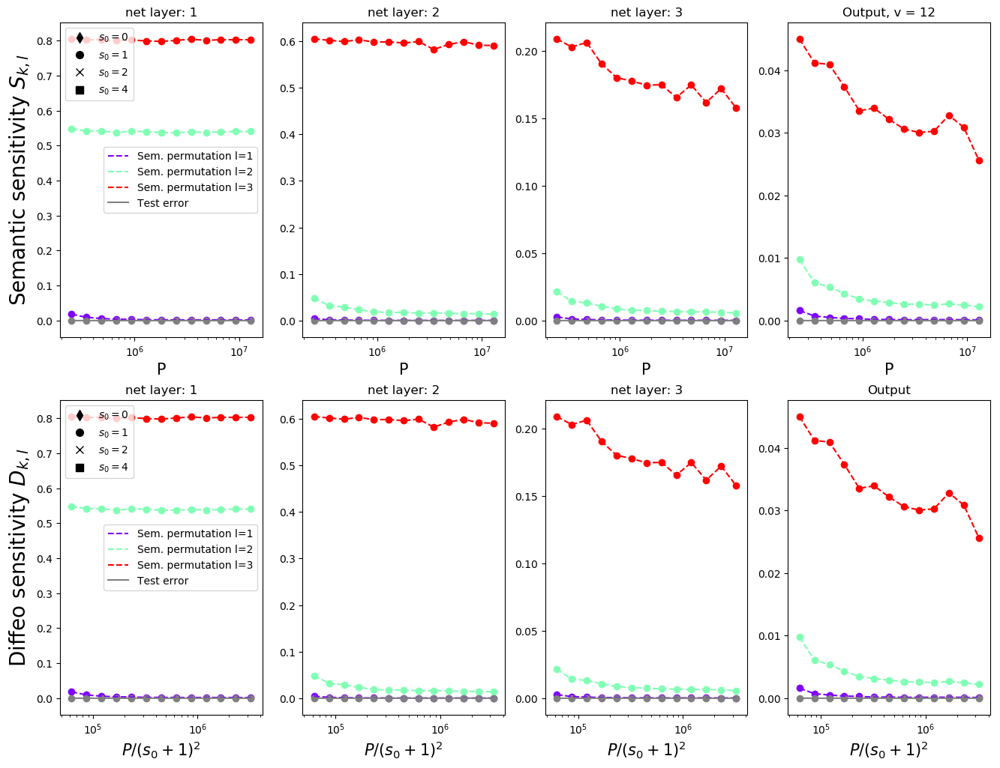

In [8]:
ns = [3,4,8,10,12]
L=3
s=2

s0s = [0,1,2,4]#,2,4,6

bs = 20

colors = cm.rainbow(np.linspace(0, 1, L))
for n in ns:
    print('V='+str(n))
    m = n**(s-1)
    fig, axs = plt.subplots(2,(L+1), figsize = (16,12))
    if n>=10:
        s0s = [0,1,2]
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        
        if (L==3 and s==2) or (s==3 and v==4) or (s==4 and L==2):
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        else:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        print(xx)    
        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                #print(s0s[idx_s0])
                #print(xx)
                #print(mat_all_sem[idx_s0,:len(xx),k,l])
                if idx_s0==0:
                    axs[0,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[0,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],ls='--') 
                axs[0,k].scatter(xx, mat_all_pos[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[0,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[0,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[0,k].set_xlabel("P",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[0,0].set_ylabel("Semantic sensitivity $S_{k,l}$",size = 20)
                axs[0,0].legend()
            if k<(L):
                axs[0,k].set_title("net layer: %d" %(k+1))
            else:
                axs[0,L].set_title("Output, v = "+str(n))

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    first_legend = axs[0,0].legend()
    ax = axs[0,0].add_artist(first_legend)
    axs[0,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  

    #plt.savefig("sens_sem_L%d_n%d_0s.pdf" %(L,n))
    #plt.savefig("sens_sem_L%d_n%d_0s.png" %(L,n), bbox_inches='tight')

    #fig, axs = plt.subplots(1,(L+1), figsize = (16,4))
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        if (L==3 and s==2) or (s==3 and v==4) or (s==4 and L==2):
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        else:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        xx = xx/(s0s[idx_s0]+1)**(2)

        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                if idx_s0==0:
                    axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],ls='--') 
                axs[1,k].scatter(xx, mat_all_pos[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[1,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[1,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[1,k].set_xlabel(r"$P/(s_0+1)^{2}$",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[1,0].set_ylabel("Diffeo sensitivity $D_{k,l}$",size = 20)
                #axs[1,0].legend()
            if k<(L):
                axs[1,k].set_title("net layer: %d" %(k+1))
            else:
                axs[1,L].set_title("Output")

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    first_legend = axs[1,0].legend()
    ax = axs[1,0].add_artist(first_legend)
    axs[1,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  
    #plt.savefig("figures/sens_sem_L%d_n%d_0s_cnn.png" %(L,n), bbox_inches='tight')

V=4
V=6


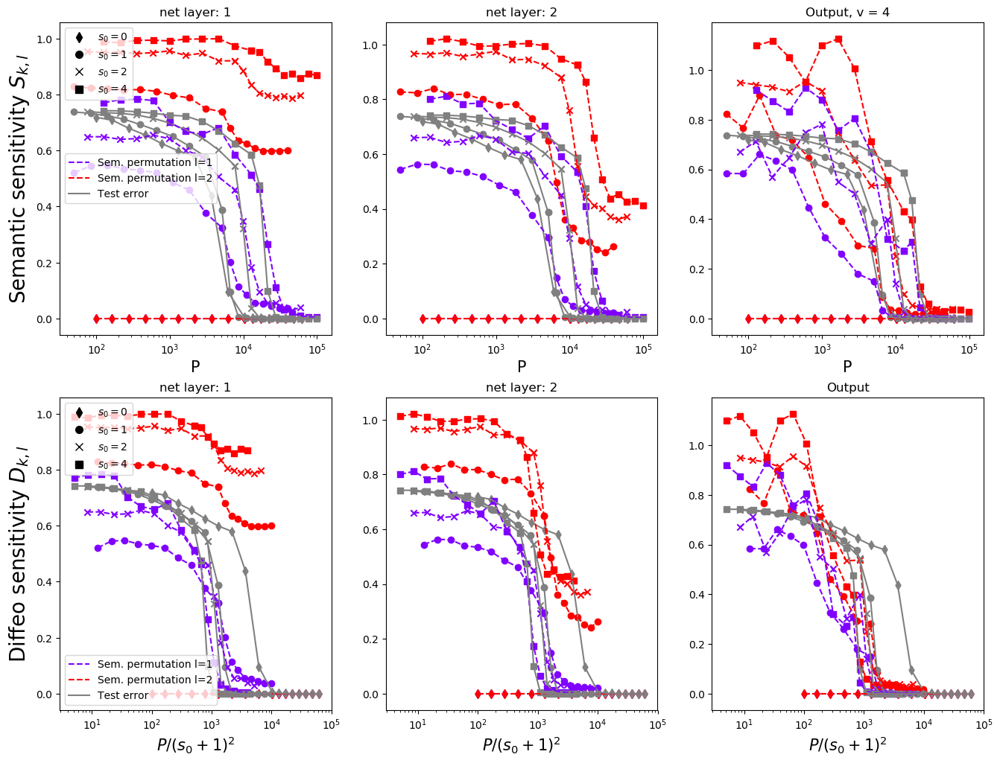

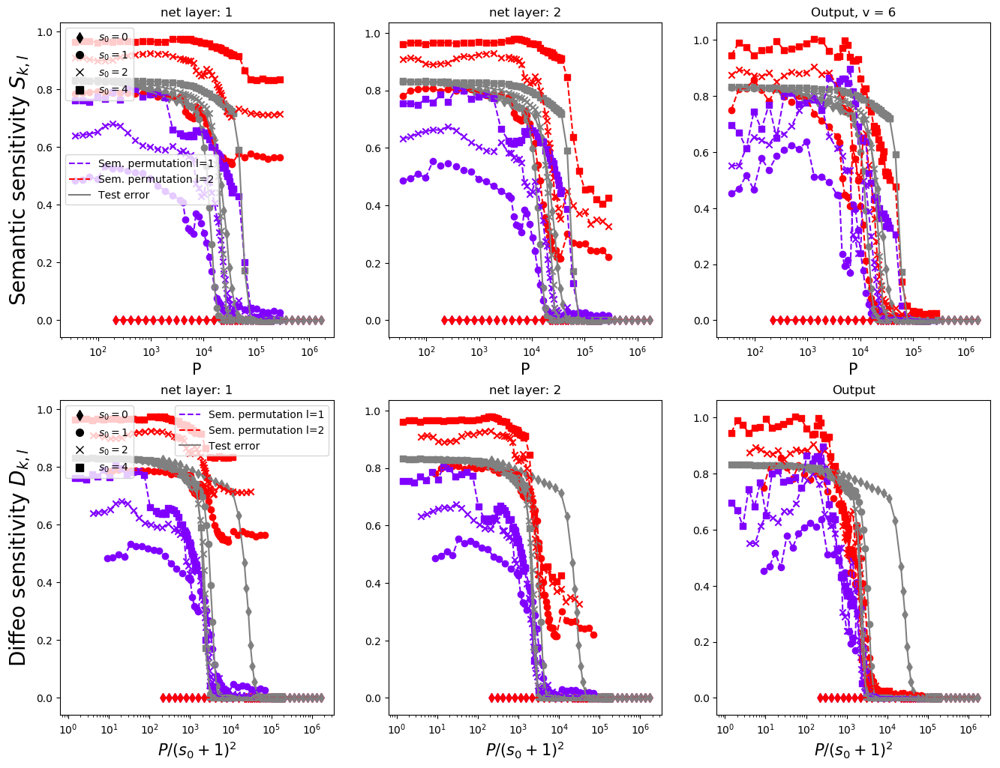

In [12]:
ns = [4,6]
L=2
s=3

s0s = [0,1,2,4]#,2,4,6

bs = 20

colors = cm.rainbow(np.linspace(0, 1, L))
for n in ns:
    print('V='+str(n))
    m = n**(s-1)
    fig, axs = plt.subplots(2,(L+1), figsize = (16,12))
    if n>=10:
        s0s = [0,1,2]
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        
        if (L==3 and s==2) or (s==3 and n==4) or (s==4 and L==2):
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        else:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        #print(xx)    
        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                #print(s0s[idx_s0])
                #print(xx)
                #print(mat_all_sem[idx_s0,:len(xx),k,l])
                if idx_s0==0:
                    axs[0,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[0,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],ls='--') 
                axs[0,k].scatter(xx, mat_all_pos[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[0,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[0,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[0,k].set_xlabel("P",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[0,0].set_ylabel("Semantic sensitivity $S_{k,l}$",size = 20)
                axs[0,0].legend()
            if k<(L):
                axs[0,k].set_title("net layer: %d" %(k+1))
            else:
                axs[0,L].set_title("Output, v = "+str(n))

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    first_legend = axs[0,0].legend()
    ax = axs[0,0].add_artist(first_legend)
    axs[0,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  

    #plt.savefig("sens_sem_L%d_n%d_0s.pdf" %(L,n))
    #plt.savefig("sens_sem_L%d_n%d_0s.png" %(L,n), bbox_inches='tight')

    #fig, axs = plt.subplots(1,(L+1), figsize = (16,4))
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        if (L==3 and s==2) or (s==3 and n==4) or (s==4 and L==2):
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        else:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        xx = xx/(s0s[idx_s0]+1)**(2)

        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                if idx_s0==0:
                    axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],ls='--') 
                axs[1,k].scatter(xx, mat_all_pos[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[1,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[1,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[1,k].set_xlabel(r"$P/(s_0+1)^{2}$",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[1,0].set_ylabel("Diffeo sensitivity $D_{k,l}$",size = 20)
                #axs[1,0].legend()
            if k<(L):
                axs[1,k].set_title("net layer: %d" %(k+1))
            else:
                axs[1,L].set_title("Output")

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    first_legend = axs[1,0].legend()
    ax = axs[1,0].add_artist(first_legend)
    axs[1,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  
    #plt.savefig("figures/sens_sem_L%d_n%d_0s_cnn.png" %(L,n), bbox_inches='tight')

In [ ]:
ns = [4,6]
L=2
s=3

s0s = [0,1,2,4]#,2,4,6

bs = 20

colors = cm.rainbow(np.linspace(0, 1, L))
for n in ns:
    print('V='+str(n))
    m = n**(s-1)
    fig, axs = plt.subplots(2,(L+1), figsize = (16,12))
    if n>=10:
        s0s = [0,1,2]
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        
        if (L==3 and s==2) or (s==3 and n==4) or (s==4 and L==2):
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        else:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        #print(xx)    
        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                #print(s0s[idx_s0])
                #print(xx)
                #print(mat_all_sem[idx_s0,:len(xx),k,l])
                if idx_s0==0:
                    axs[0,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[0,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],ls='--') 
                axs[0,k].scatter(xx, mat_all_pos[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[0,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[0,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[0,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[0,k].set_xlabel("P",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[0,0].set_ylabel("Semantic sensitivity $S_{k,l}$",size = 20)
                axs[0,0].legend()
            if k<(L):
                axs[0,k].set_title("net layer: %d" %(k+1))
            else:
                axs[0,L].set_title("Output, v = "+str(n))

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    first_legend = axs[0,0].legend()
    ax = axs[0,0].add_artist(first_legend)
    axs[0,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  

    #plt.savefig("sens_sem_L%d_n%d_0s.pdf" %(L,n))
    #plt.savefig("sens_sem_L%d_n%d_0s.png" %(L,n), bbox_inches='tight')

    #fig, axs = plt.subplots(1,(L+1), figsize = (16,4))
    for idx_s0 in range(len(s0s)):
        s0 = s0s[idx_s0]
        if (L==3 and s==2) or (s==3 and n==4) or (s==4 and L==2):
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_bs_%d_cnn.pt'%(L,n,m,s0,s,bs))
        else:
            mat_all_pos = torch.load('mats/mat_pos_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_all_sem = torch.load('mats/mat_sem_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            mat_terr = torch.load('mats/mat_terr_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
            xx = torch.load('mats/xx_L_%d_n_%d_m_%d_s0_%d_s_%d_cnn.pt'%(L,n,m,s0,s))
        if L==2 and s0>0:
            xx =xx
        else:
            xx = xx*n
        xx = xx/(s0s[idx_s0]+1)**(2)

        if idx_s0==0:
            mar = "d"
        elif idx_s0==1:
            mar = "o"
        elif idx_s0==2:
            mar = "x"
        elif idx_s0==3:
            mar = "s"
        for k in range(L+1):
            for l in range(L):
                #print(mat_all[:,k,l])
                if idx_s0==0:
                    axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],label ="Sem. permutation l=%d" %(l+1),ls='--') 
                else: 
                    axs[1,k].plot(xx, mat_all_pos[:len(xx),k,l], color = colors[l],ls='--') 
                axs[1,k].scatter(xx, mat_all_pos[:len(xx),k,l] ,marker = mar ,color = colors[l]) 
                #axs[k].plot(xx, mat_norms[:,k,l], color = 'black',label ="norm l=%d" %(l+1)) 
            if idx_s0==0:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey',label ="Test error" ) 
            else:
                axs[1,k].plot(xx, mat_terr[:len(xx)], color = 'grey') 
            axs[1,k].scatter(xx, mat_terr[:len(xx)], color = 'grey', marker = mar)
            axs[1,k].set_xscale("log")
            #axs[k].set_yscale("log")
            axs[1,k].set_xlabel(r"$P/(s_0+1)^{2}$",size = 15)
            #axs[k].set_ylim(0,1)
            if k==0: 
                axs[1,0].set_ylabel("Diffeo sensitivity $D_{k,l}$",size = 20)
                #axs[1,0].legend()
            if k<(L):
                axs[1,k].set_title("net layer: %d" %(k+1))
            else:
                axs[1,L].set_title("Output")

    s01 = mlines.Line2D([], [], color='black', marker='d', linestyle='None',
                  markersize=7, label=r'$s_0=0$')
    s02 = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                  markersize=7, label=r'$s_0=1$')
    s03 = mlines.Line2D([], [], color='black', marker='x', linestyle='None',
                  markersize=7, label=r'$s_0=2$')
    s04 = mlines.Line2D([], [], color='black', marker='s', linestyle='None',
                  markersize=7, label=r'$s_0=4$')
    first_legend = axs[1,0].legend()
    ax = axs[1,0].add_artist(first_legend)
    axs[1,0].legend(handles=[s01,s02,s03,s04],loc = 'upper left')  
    #plt.savefig("figures/sens_sem_L%d_n%d_0s_cnn.png" %(L,n), bbox_inches='tight')